<a href="https://colab.research.google.com/github/Shrondi/smart-bridges/blob/main/train_detection_smartbridges.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importación e instalación

In [2]:
# Acelerómetros:
# 1: IAM20680, 16bits, +-2g, 100Hz: https://invensense.tdk.com/download-pdf/iam-20680-datasheet/
# 2: IIM42352, 16bits, +-2g, 100Hz: https://invensense.tdk.com/products/smartindustrial/iim-42352/
# 3: ADXL355, 20bits, +-2g, 125Hz:  https://www.analog.com/media/en/technical-documentation/data-sheets/adxl354_adxl355.pdf

# !apt-get install -q mysql-client
!pip install -q mysql-connector-python mysqlclient
!pip install -q pandas
!pip install -q matplotlib
!pip install -q plotly
!pip install -q scipy
!pip install ruptures

In [3]:
import mysql.connector
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from scipy.signal import find_peaks

# Definición funciones

## Funciones auxiliares

In [4]:
def get_accelerometer_data(accelerometer, datetime_init, datetime_end):
    querystr = f"""\
    SELECT
        DATE_ADD(
        time_begin,
        INTERVAL
        (
            CASE
                WHEN ca.frequency = 0 THEN 1/31.25
                ELSE 1/125
            END
        ) * (
            SELECT COUNT(*)
            FROM data_accelerometer da_inner
            WHERE da_inner.data_block = da.data_block
            AND da_inner.id <= da.id
        ) - 1
        SECOND_MICROSECOND
    ) AS incrementada,

    axisx * (POW(2, scale+2) / POW(2, word_bits)) AS x,
	  axisy * (POW(2, scale+2) / POW(2, word_bits)) AS y,
	  axisz * (POW(2, scale+2) / POW(2, word_bits)) AS z,
    da.data_block,
    da.id
    FROM
        data_block db
        STRAIGHT_JOIN data_accelerometer da ON da.data_block = db.id
        STRAIGHT_JOIN configuration_acc ca ON ca.id = db.configuration
        STRAIGHT_JOIN accelerometer ac ON ac.sensor = ca.accelerometer
        STRAIGHT_JOIN chip ch ON ch.id = ac.chip
    WHERE
        time_begin BETWEEN '{datetime_init}' AND '{datetime_end}'
        AND ac.sensor = {accelerometer}"""

    cursor.execute(querystr)
    results = cursor.fetchall()
    return results

In [5]:
def plot_accelerometer_data(data, axes=['z', 'y', 'x'], min_date=None, max_date=None, download=None):

  # Convertir data a Pandas DataFrame
  df = pd.DataFrame(data)
  df.set_index(0, inplace=True)
  df.sort_values(0, inplace=True)

  # Seleccionar las columnas necesarias y establecer el índice
  df = df[[1, 2, 3, 4]]
  df.rename(columns={1: 'x', 2: 'y', 3: 'z', 4: 'data_block'}, inplace=True)
  df.index.name = 'datetime'

  # Configurar el tamaño de la figura
  fig, ax = plt.subplots(figsize=(10, 3))

  # Configurar la escala temporal si se proporcionan min_date y max_date
  if min_date is not None and max_date is not None:
    min_date = pd.to_datetime(min_date)
    max_date = pd.to_datetime(max_date)
    ax.set_xlim(min_date, max_date)

    df = df[(df.index >= min_date) & (df.index <= max_date)]

  # Graficar la aceleración en cada eje
  colors = {'x': 'b', 'y': 'y', 'z': 'g'}
  for axis in axes:
    if axis in df.columns:
      ax.plot(df.index, df[axis], label=axis.upper(), color=colors.get(axis))

  # Configurar el título y las etiquetas de los ejes
  ax.set_title('Accel. data', fontsize=12,fontweight='bold')
  ax.set_xlabel('tiempo', fontsize=12)
  ax.set_ylabel('aceleración [g]', fontsize=12)

  # Configurar el tamaño de los ticklabels del eje x
  ax.tick_params(axis='x', labelsize=12)

  # Agregar una leyenda
  ax.legend(loc="lower left")

  # Configurar el borde sólido de la zona de representación de datos
  ax.spines['left'].set_linewidth(1)
  ax.spines['bottom'].set_linewidth(1)
  ax.spines['right'].set_linewidth(1)
  ax.spines['top'].set_linewidth(1)

  # Configurar la rejilla de líneas punteadas y semitransparentes
  ax.grid(which='major', linestyle='--', alpha=0.5)
  ax.grid(which='minor', linestyle=':', alpha=0.3)

  # Mostrar la gráfica
  plt.show()

  if download is not None:
    try:
      csv_data = df.to_csv(download+'.csv',index=True)
      files.download(download+'.csv')
    except Exception as e:
      print("Error en la exportación: ", e)

  return df

In [6]:
def plot_vibration(data, axes=['z', 'y', 'x'], min_date=None, max_date=None, download=None):

  # Convertir data a Pandas DataFrame
  df = pd.DataFrame(data, columns=['datetime', 'x', 'y', 'z'])
  df.set_index('datetime', inplace=True)
  df.sort_values('datetime', inplace=True)

  # Seleccionar las columnas necesarias y establecer el índice
  df = df[['x', 'y', 'z']]

  # Configurar la escala temporal si se proporcionan min_date y max_date
  if min_date is not None and max_date is not None:
    min_date = pd.to_datetime(min_date)
    max_date = pd.to_datetime(max_date)
    #ax.set_xlim(min_date, max_date) # comentado ya que ahora hay 2 axes

    df = df[(df.index >= min_date) & (df.index <= max_date)]

  # Crear dos subplots (gráficas)
  fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))  # 2 filas, 1 columna

  # Configurar la rejilla de líneas punteadas y semitransparentes
  ax1.grid(which='major', linestyle='--', alpha=0.5)
  ax1.grid(which='minor', linestyle=':', alpha=0.3)

  ax2.grid(which='major', linestyle='--', alpha=0.5)
  ax2.grid(which='minor', linestyle=':', alpha=0.3)

  # Graficar 'x' e 'y' en el primer subplot (ax1)
  colors = {'x': 'b', 'y': 'y'}
  for axis in ['x', 'y']:  # Solo iterar sobre 'x' e 'y'
      if axis in df.columns:
          ax1.scatter(df.index, df[axis], label=axis.upper(), color=colors.get(axis), marker='o', s=10)

  # Configurar el título y las etiquetas del primer subplot
  ax1.set_title('Accel. data (X e Y)', fontsize=12, fontweight='bold')
  ax1.set_xlabel('tiempo', fontsize=12)
  ax1.set_ylabel('aceleración [g]', fontsize=12)
  ax1.legend(loc="lower left")

  # Fijar los límites del eje y para 'x' e 'y'
  ax1.set_ylim([-0.15, 0.15])  # <- Aquí se fijan los límites

 # Graficar 'z' en el segundo subplot (ax2)
  if 'z' in df.columns:
      ax2.scatter(df.index, df['z'], label='Z', color='g', marker='o', s=10)

  # Configurar el título y las etiquetas del segundo subplot
  ax2.set_title('Accel. data (Z)', fontsize=12, fontweight='bold')
  ax2.set_xlabel('tiempo', fontsize=12)
  ax2.set_ylabel('aceleración [g]', fontsize=12)
  ax2.legend(loc="lower left")

  # Ajustar el eje z al mínimo y máximo de los datos
  ax2.autoscale()  # <- Aquí se ajusta el eje z

  # Ajustar el espacio entre los subplots
  plt.tight_layout()

  # Mostrar la gráfica
  plt.show()

  if download is not None:
    try:
      csv_data = df.to_csv(download+'.csv',index=True)
      files.download(download+'.csv')
    except Exception as e:
      print("Error en la exportación: ", e)

  return df

## Funciones BD

In [7]:
def get_trains(name_bridge, datetime_init, datetime_end, UMBRAL_VIBRACION):
    querystr = f"""

      WITH train AS (
        SELECT
            DATE_ADD(
              time_begin,
              INTERVAL
              (
                  CASE
                      WHEN ca.frequency = 0 THEN 1/31.25
                      ELSE 1/125
                  END
              ) * (
                  SELECT COUNT(*)
                  FROM data_accelerometer da_inner
                  WHERE da_inner.data_block = da.data_block
                  AND da_inner.id <= da.id
              ) - 1
              SECOND_MICROSECOND
          ) AS incrementada,

          axisx * (POW(2, scale+2) / POW(2, word_bits)) AS x,
          axisy * (POW(2, scale+2) / POW(2, word_bits)) AS y,
          axisz * (POW(2, scale+2) / POW(2, word_bits)) AS z,

          db.accelerometer as accelerometer,

            SQRT(
                POW(axisx * (POW(2, scale + 2) / POW(2,  word_bits)), 2) +
                POW(axisy * (POW(2, scale + 2) / POW(2,  word_bits)), 2) +
                POW(axisz * (POW(2, scale + 2) / POW(2,  word_bits)), 2)
            ) AS mag_acel

        FROM
          data_block db
          STRAIGHT_JOIN data_accelerometer da ON da.data_block = db.id
          STRAIGHT_JOIN configuration_acc ca ON ca.id = db.configuration
          STRAIGHT_JOIN accelerometer ac ON ac.sensor = ca.accelerometer
          STRAIGHT_JOIN chip ch ON ch.id = ac.chip
          STRAIGHT_JOIN sensors s ON s.id = ac.sensor
          STRAIGHT_JOIN devices d ON d.id = s.device
          STRAIGHT_JOIN bridges b ON b.id = d.bridge
        WHERE time_begin BETWEEN '{datetime_init}' AND '{datetime_end}'
        AND b.name = '{name_bridge}'
        )


        SELECT incrementada, x, y, z, accelerometer
        FROM train
        WHERE mag_acel >= {UMBRAL_VIBRACION}

    """
    cursor.execute(querystr)
    results = cursor.fetchall()
    return results

In [8]:
def get_data_train(name_bridge, start_time, end_time):
    querystr = f"""
        SELECT
            DATE_ADD(
              time_begin,
              INTERVAL
              (
                  CASE
                      WHEN ca.frequency = 0 THEN 1/31.25
                      ELSE 1/125
                  END
              ) * (
                  SELECT COUNT(*)
                  FROM data_accelerometer da_inner
                  WHERE da_inner.data_block = da.data_block
                  AND da_inner.id <= da.id
              ) - 1
              SECOND_MICROSECOND
          ) AS incrementada,

          axisx * (POW(2, scale+2) / POW(2, word_bits)) AS x,
          axisy * (POW(2, scale+2) / POW(2, word_bits)) AS y,
          axisz * (POW(2, scale+2) / POW(2, word_bits)) AS z,
          db.accelerometer as accelerometer

        FROM
          data_block db
          STRAIGHT_JOIN data_accelerometer da ON da.data_block = db.id
          STRAIGHT_JOIN configuration_acc ca ON ca.id = db.configuration
          STRAIGHT_JOIN accelerometer ac ON ac.sensor = ca.accelerometer
          STRAIGHT_JOIN chip ch ON ch.id = ac.chip
          STRAIGHT_JOIN sensors s ON s.id = ac.sensor
          STRAIGHT_JOIN devices d ON d.id = s.device
          STRAIGHT_JOIN bridges b ON b.id = d.bridge
        WHERE time_begin BETWEEN '{start_time}' AND '{end_time}'
        AND b.name = '{name_bridge}'

    """
    cursor.execute(querystr)
    results = cursor.fetchall()
    return results

## Funciones lógica

In [24]:
def plot_train(input_path, axes=['z', 'y', 'x'], min_date=None, max_date=None, accelerometers=None):
    """
    Loads data from CSV files (directory or single file) and plots them on the same graph.
    """

    def plot_accelerometer_data(df, axes=['z', 'y', 'x'], min_date=None, max_date=None, accelerometer=None, ax1=None, ax2=None):
        """Helper function to plot data from a DataFrame on shared axes."""

        if min_date is not None and max_date is not None:
            min_date = pd.to_datetime(min_date)
            max_date = pd.to_datetime(max_date)
            df = df[(df.index >= min_date) & (df.index <= max_date)]

        colors = {'x': 'b', 'y': 'y'}
        for axis in ['x', 'y']:
            if axis in df.columns:
                ax1.plot(df.index, df[axis], label=f'{axis.upper()} - Acc {accelerometer}', color=colors.get(axis))

        # Configurar el título y las etiquetas del primer subplot
        ax1.set_title('Accel. data (X e Y)', fontsize=12, fontweight='bold')
        ax1.set_xlabel('tiempo', fontsize=12)
        ax1.set_ylabel('aceleración [g]', fontsize=12)
        ax1.legend(loc="lower left")
        ax1.set_ylim([-0.15, 0.15])

        # Graficar 'z' en el segundo subplot (ax2)
        if 'z' in df.columns:
            ax2.plot(df.index, df['z'], label=f'Z - Acc {accelerometer}', color='g')

        # Configurar el título y las etiquetas del segundo subplot
        ax2.set_title('Accel. data (Z)', fontsize=12, fontweight='bold')
        ax2.set_xlabel('tiempo', fontsize=12)
        ax2.set_ylabel('aceleración [g]', fontsize=12)
        ax2.legend(loc="lower left")
        ax2.autoscale()  # Ajustar el eje z

    def plot_csv(filepath):
        """Loads and processes a single CSV file."""
        print(f"Procesando archivo: {filepath}")
        try:
            df = pd.read_csv(filepath, index_col='datetime', parse_dates=['datetime'],
                            date_format='%Y-%m-%d %H:%M:%S.%f', dayfirst=True)

            if accelerometers is not None:
                df = df[df['accelerometer'].isin(accelerometers if isinstance(accelerometers, list) else [accelerometers])]

            if not df.empty:
                # Create figure and axes outside the loop (only once)
                fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))

                # Configurar la rejilla de líneas punteadas y semitransparentes
                for ax in [ax1, ax2]:
                    ax.grid(which='major', linestyle='--', alpha=0.5)
                    ax.grid(which='minor', linestyle=':', alpha=0.3)

                for acc_num in df['accelerometer'].unique():
                    df_acc = df[df['accelerometer'] == acc_num]
                    df_acc = df_acc[['x', 'y', 'z']]

                    plot_accelerometer_data(df_acc, axes, min_date, max_date, acc_num, ax1, ax2)

                plt.show()  # Show the plot after processing all accelerometers in the file

            else:
                print(f"No se encontraron datos para el/los acelerómetro(s) {accelerometers} en el archivo {filepath}")

        except Exception as e:
            print(f"Error al procesar el archivo {filepath}: {e}")

    if os.path.isdir(input_path):
        for filename in [f for f in os.listdir(input_path) if f.endswith(".csv")]:
            plot_csv(os.path.join(input_path, filename))

    elif os.path.isfile(input_path) and input_path.endswith(".csv"):
        plot_csv(input_path)

In [10]:
def save_trains(trains, name_bridge, output_dir="trains"):
    """Guarda los datos de cada tren en un archivo CSV separado.

    Args:
        trains: La salida de la función separate_trains_improved (diccionario con índices de inicio y fin).
        name_bridge: Nombre del puente para la consulta a la base de datos.
        output_dir: El directorio donde se guardarán los archivos CSV.
    """
    os.makedirs(output_dir, exist_ok=True)

    for train_number, (start_time, end_time, acc) in trains.items():
        # Obtener los datos del tren actual usando get_data_train
        train_data = get_data_train(name_bridge, start_time, end_time)

        # Convertir los datos a un DataFrame de Pandas
        train_data = pd.DataFrame(train_data, columns=['datetime', 'x', 'y', 'z', 'accelerometer'])
        train_data.set_index('datetime', inplace=True)
        train_data.sort_values('datetime', inplace=True)

        # Seleccionar las columnas deseadas
        train_data = train_data[['x', 'y', 'z', 'accelerometer']]

        # Guardar el DataFrame en un archivo CSV
        filename = os.path.join(output_dir, f"train_{train_number}.csv")
        train_data.to_csv(filename, index=True, index_label='datetime')
        print(f"Tren {train_number} guardado en {filename}")

In [11]:
def separate_trains(df, WINDOWS_SECONS):
    """Agrupa los data_blocks de cada tren y devuelve los timestamps de inicio y fin.

    Args:
        df: El DataFrame que contiene los datos del tren.
        WINDOWS_SECONS: El umbral en segundos para agregar al inicio y al final de cada tren.

    Returns:
        Un diccionario donde las claves son los números de tren y
        los valores son una lista con [timestamp_inicio, timestamp_fin] para cada tren.
    """

    df = pd.DataFrame(data, columns=['datetime', 'x', 'y', 'z', 'accelerometer'])
    df.set_index('datetime', inplace=True)
    df.sort_values('datetime', inplace=True)

    train_number = 1
    trains = {}  # Diccionario para almacenar los timestamps de inicio y fin de cada tren
    current_train_timestamp = []  # Lista para almacenar los data_blocks del tren actual

    for i in range(len(df)):
        current_train_timestamp.append(df.index[i])  # Agregar el timestamp actual al tren actual
        acc = df.iloc[i]['accelerometer']

        # Verificar si el siguiente data_block pertenece al mismo tren
        if i + 1 < len(df):
            time_diff = df.index[i + 1] - df.index[i]
            if time_diff >= pd.Timedelta(minutes=1):
                # Nuevo tren detectado
                # Agregar WINDOWS_SECONS al inicio y al final del tren
                start_time = current_train_timestamp[0] - pd.Timedelta(seconds=WINDOWS_SECONS)
                end_time = current_train_timestamp[-1] + pd.Timedelta(seconds=WINDOWS_SECONS)
                trains[train_number] = [start_time, end_time, acc]  # Guardar el timestamp de inicio y fin


                train_number += 1
                current_train_timestamp = []  # Reiniciar la lista para el nuevo tren

    # Guardar el último tren si hay data_blocks pendientes
    if current_train_timestamp:
        # Agregar WINDOWS_SECONS al inicio y al final del tren
        start_time = current_train_timestamp[0] - pd.Timedelta(seconds=WINDOWS_SECONS)
        end_time = current_train_timestamp[-1] + pd.Timedelta(seconds=WINDOWS_SECONS)
        trains[train_number] = [start_time, end_time, acc]

    return trains

# Análisis inicial

In [12]:
MYSQL_HOST = '217.76.159.153'
MYSQL_USER = 'smartbridges'
MYSQL_PASSWORD = 'Smart-bridges-2023'
MYSQL_DATABASE = 'smartbridges'

FECHA_HORA_INICIO        = '2025-02-06 09:00:00'
FECHA_HORA_FIN           = '2025-02-07 00:00:00'
NAME_BRIDGE              = 'Guadiato'

In [13]:
try:
  db = mysql.connector.connect(
    host = MYSQL_HOST,
    user = MYSQL_USER,
    password = MYSQL_PASSWORD,
    database = MYSQL_DATABASE
  )

  db.start_transaction()
  cursor = db.cursor()
  print("Conexión a la BBDD ok")

except Exception as e:
  print("Error al conectar a la BBDD: ", e)

Conexión a la BBDD ok


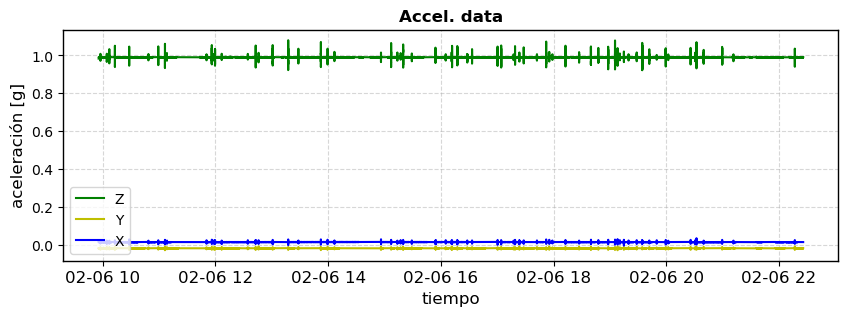

,x,y,z,data_block
datetime,,,,
2025-02-06 09:55:39.967291,0.014141,-0.019131,0.983299,133017
2025-02-06 09:55:39.975291,0.013351,-0.019035,0.990067,133017
2025-02-06 09:55:39.983291,0.013252,-0.019218,0.990150,133017
2025-02-06 09:55:39.991291,0.013248,-0.019154,0.990231,133017
2025-02-06 09:55:39.999291,0.013340,-0.019093,0.990234,133017
...,...,...,...,...
2025-02-06 22:25:50.216988,0.013538,-0.019238,0.990154,569317
2025-02-06 22:25:50.224988,0.013500,-0.019245,0.990047,569317
2025-02-06 22:25:50.232988,0.013359,-0.019344,0.989998,569317


In [ ]:
acc_data = get_accelerometer_data(1, FECHA_HORA_INICIO, FECHA_HORA_FIN)
plot_accelerometer_data(acc_data)

# Obtención de trenes (testing)


In [ ]:
data = get_trains(NAME_BRIDGE, FECHA_HORA_INICIO, FECHA_HORA_FIN, 0.995)

In [ ]:
trains = separate_trains(data, 1)

In [ ]:
print(trains)

{1: [Timestamp('2025-02-06 00:11:38.423237'), Timestamp('2025-02-06 00:14:47.423237'), 2.0], 2: [Timestamp('2025-02-06 00:37:54.471034'), Timestamp('2025-02-06 00:40:24.807919'), 4.0], 3: [Timestamp('2025-02-06 00:49:42.062715'), Timestamp('2025-02-06 00:53:12.919882'), 3.0], 4: [Timestamp('2025-02-06 09:57:31.388874'), Timestamp('2025-02-06 09:57:37.598900'), 1.0], 5: [Timestamp('2025-02-06 10:04:18.348874'), Timestamp('2025-02-06 10:04:24.358900'), 1.0], 6: [Timestamp('2025-02-06 10:07:00.902900'), Timestamp('2025-02-06 10:07:05.862900'), 1.0], 7: [Timestamp('2025-02-06 10:12:56.062900'), Timestamp('2025-02-06 10:13:03.118900'), 1.0], 8: [Timestamp('2025-02-06 10:28:10.630900'), Timestamp('2025-02-06 10:28:15.790900'), 1.0], 9: [Timestamp('2025-02-06 10:48:39.405813'), Timestamp('2025-02-06 10:48:46.054900'), 1.0], 10: [Timestamp('2025-02-06 10:59:08.502900'), Timestamp('2025-02-06 10:59:15.518900'), 1.0], 11: [Timestamp('2025-02-06 11:06:14.198900'), Timestamp('2025-02-06 11:06:21.9

In [ ]:
save_trains(trains, NAME_BRIDGE)

In [ ]:
plot_data_train_file('trains/train_1.csv')

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_114958-20250301_115002.csv


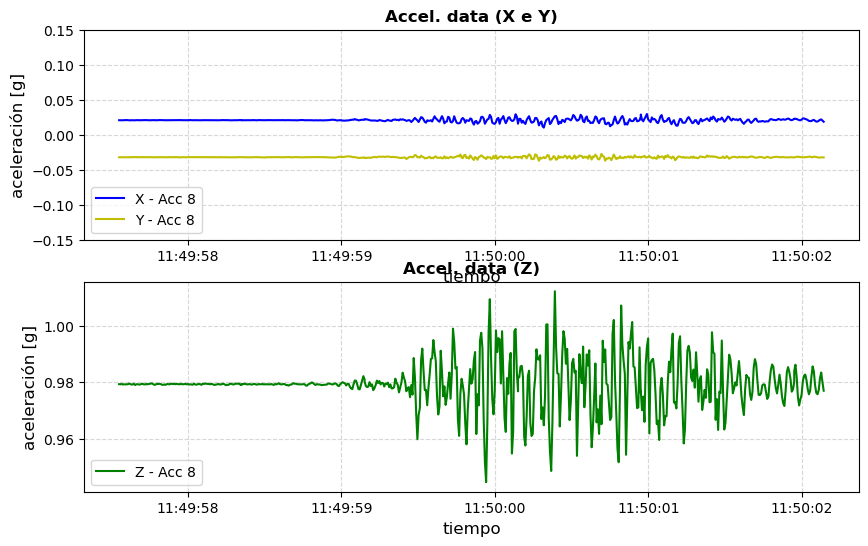

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_101229-20250301_101235.csv


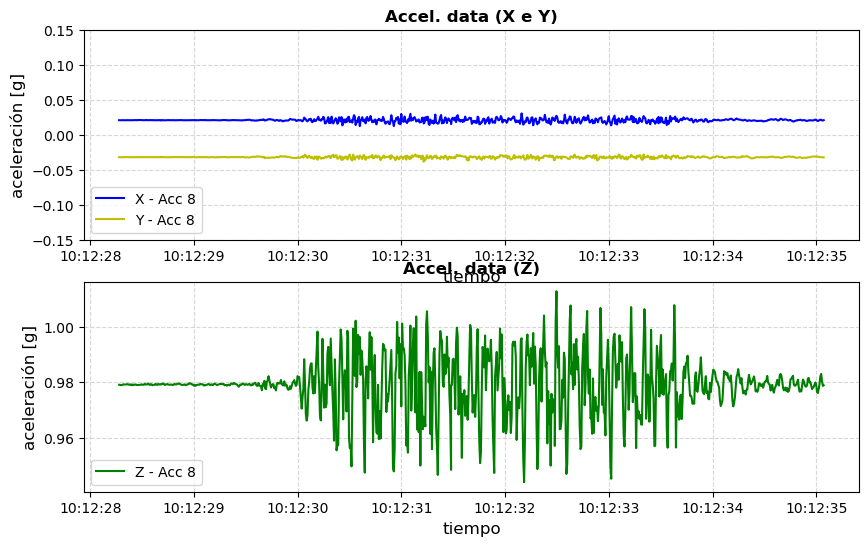

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_081559-20250301_081606.csv


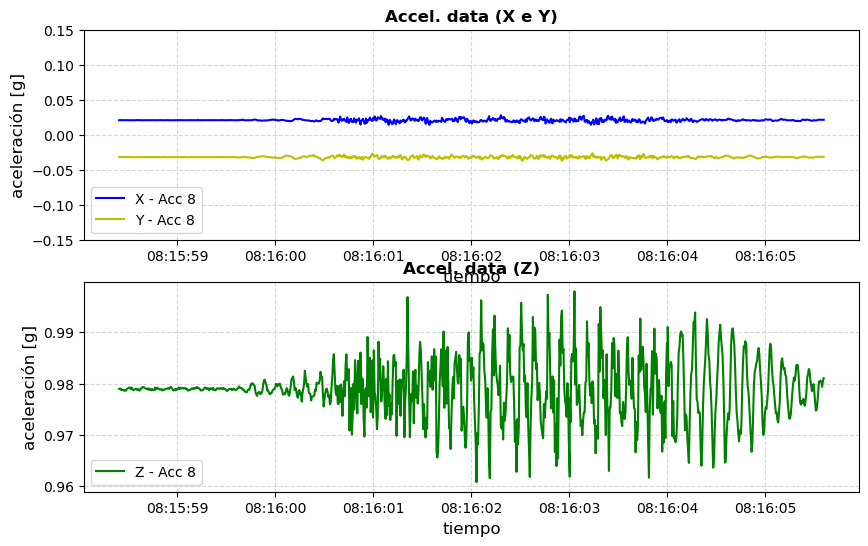

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_104702-20250301_104708.csv


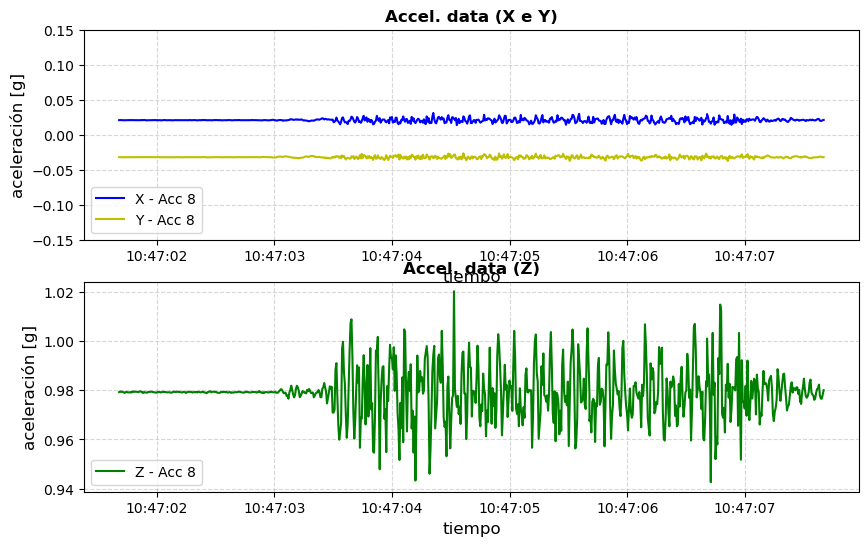

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_094636-20250301_094641.csv


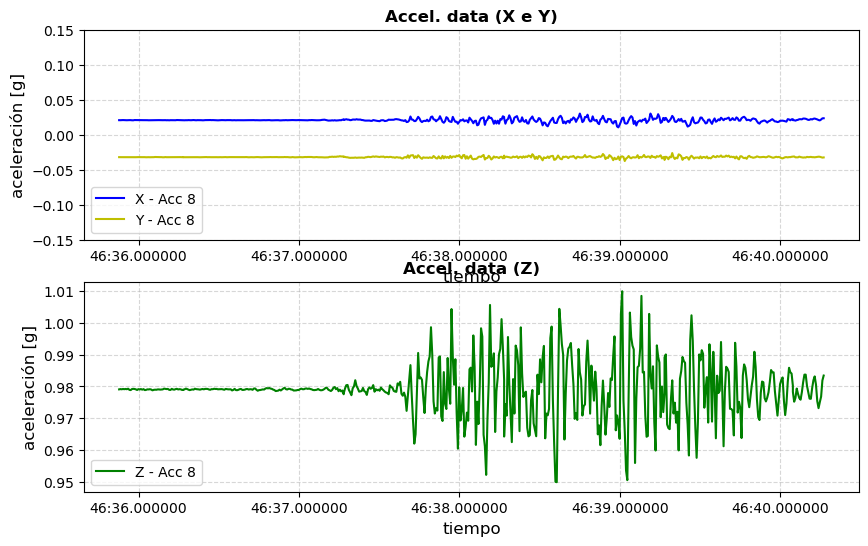

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_083614-20250301_083621.csv


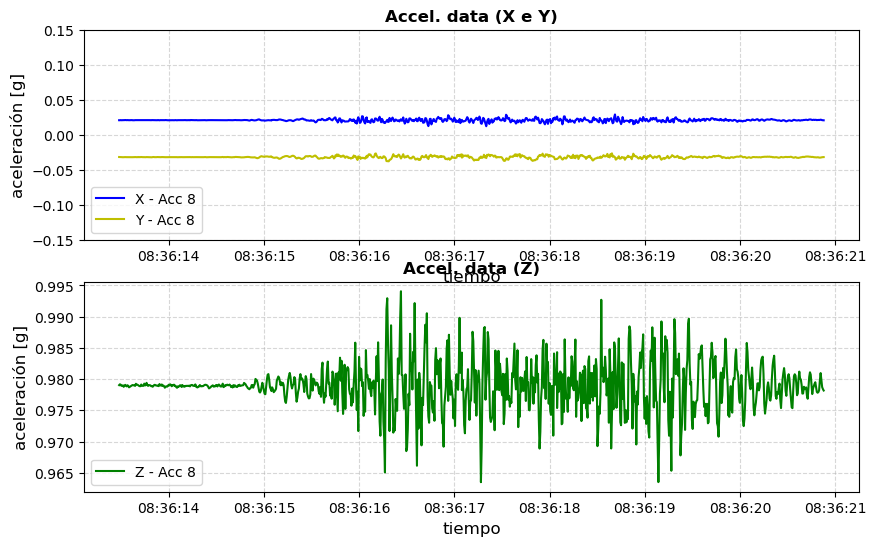

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_064704-20250301_064709.csv


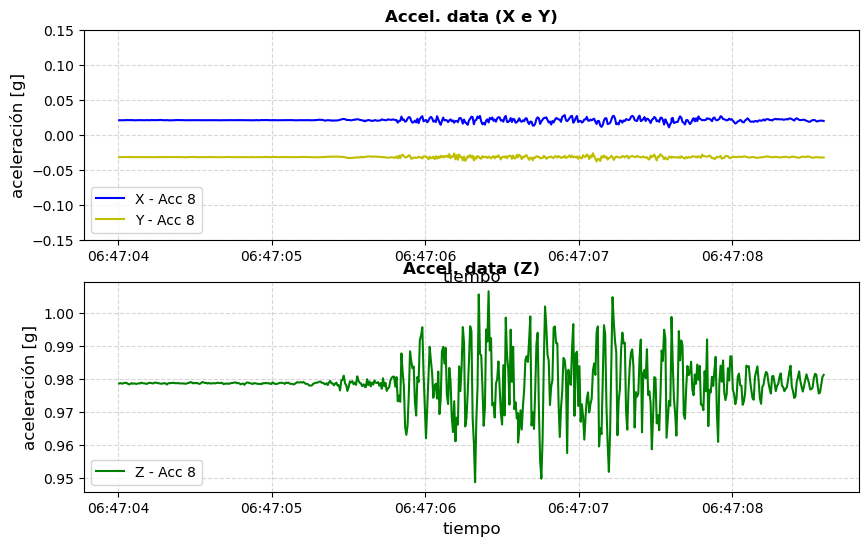

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_173440-20250301_173445.csv


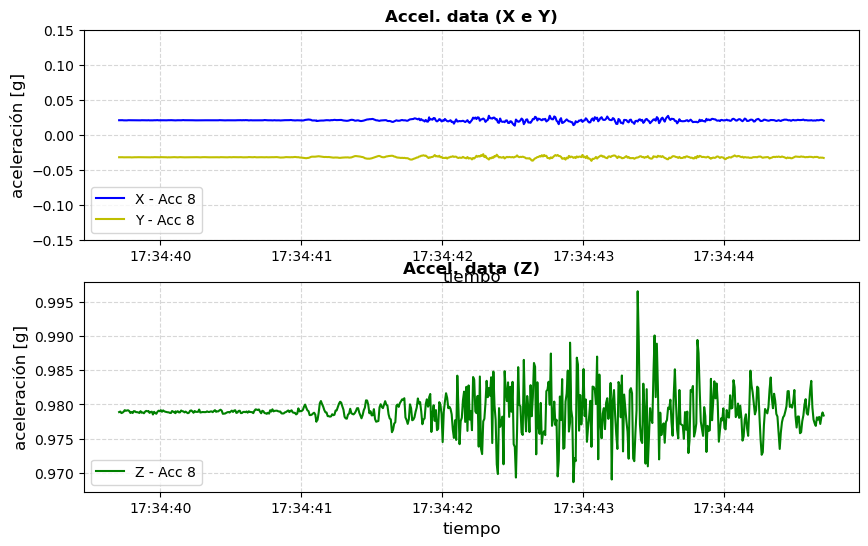

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_112626-20250301_112634.csv


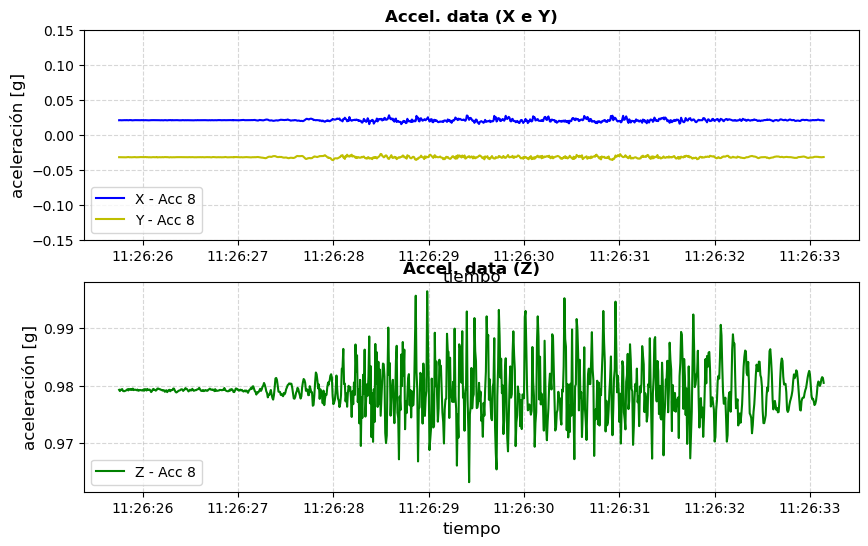

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_172931-20250301_172936.csv


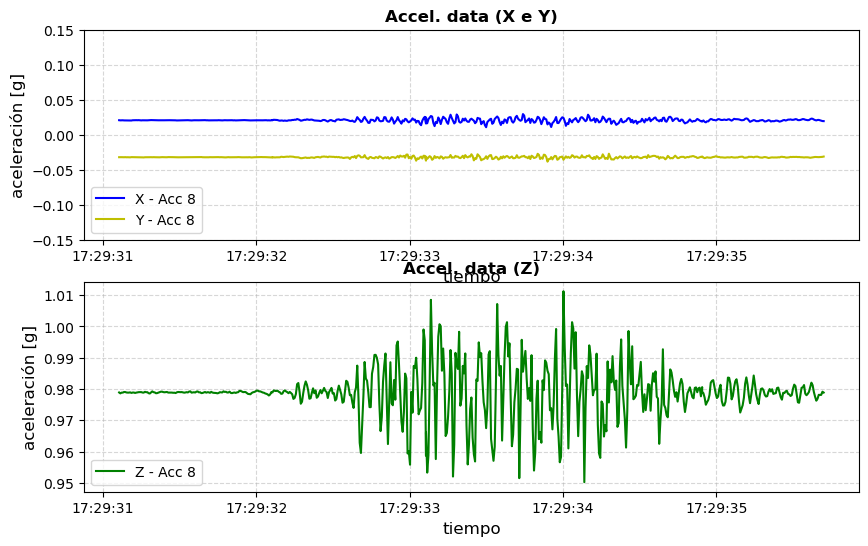

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_195231-20250301_195239.csv


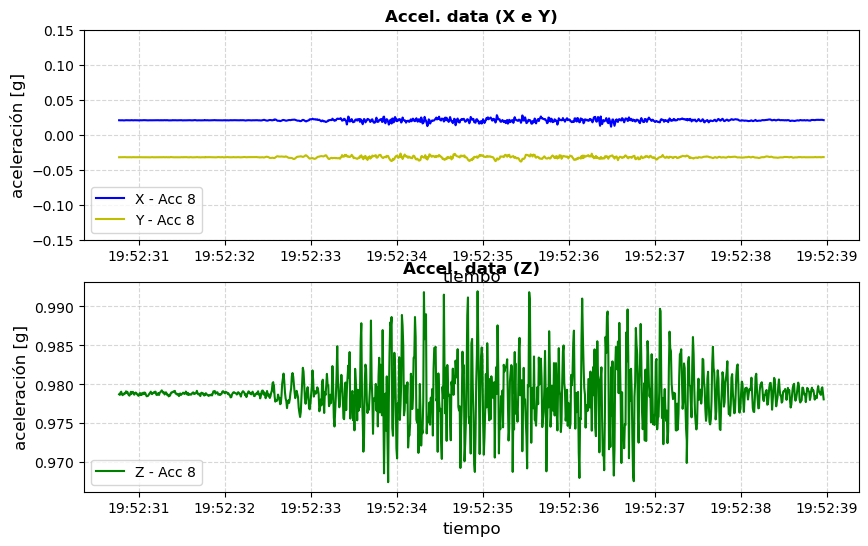

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_191247-20250301_191254.csv


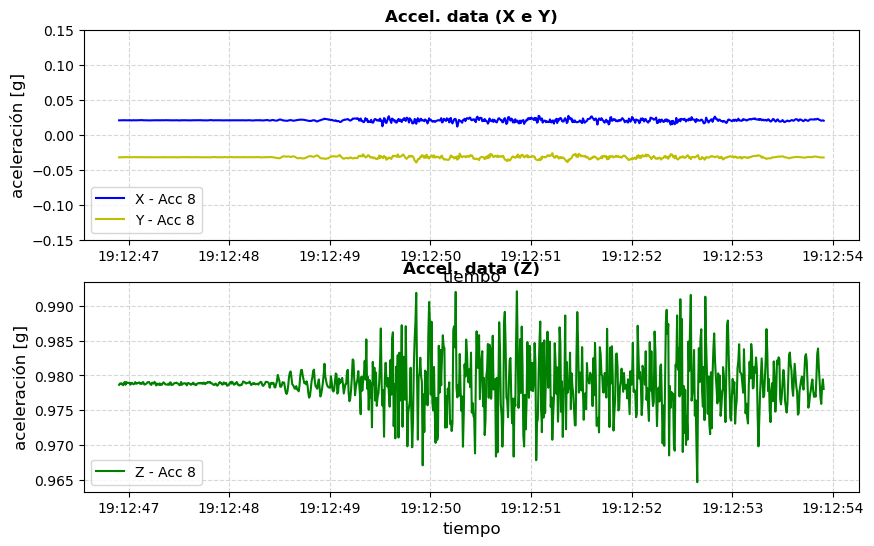

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_185214-20250301_185223.csv


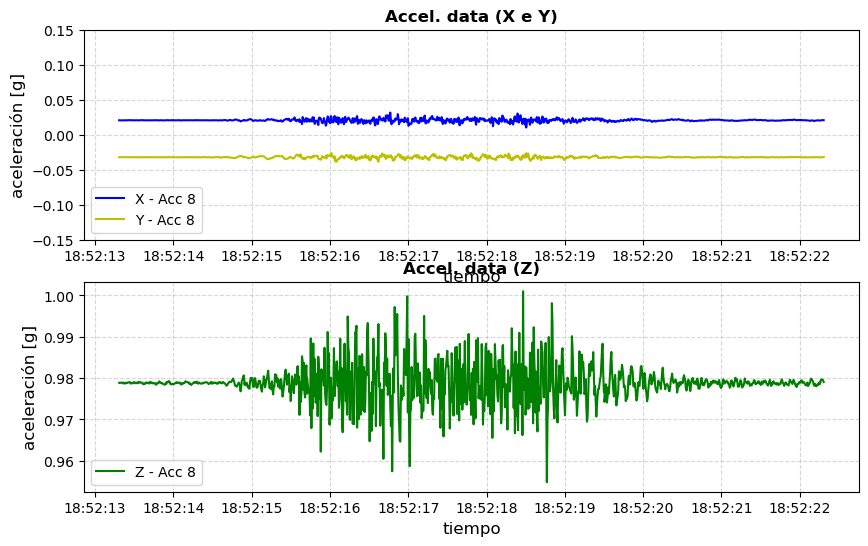

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_162718-20250301_162724.csv


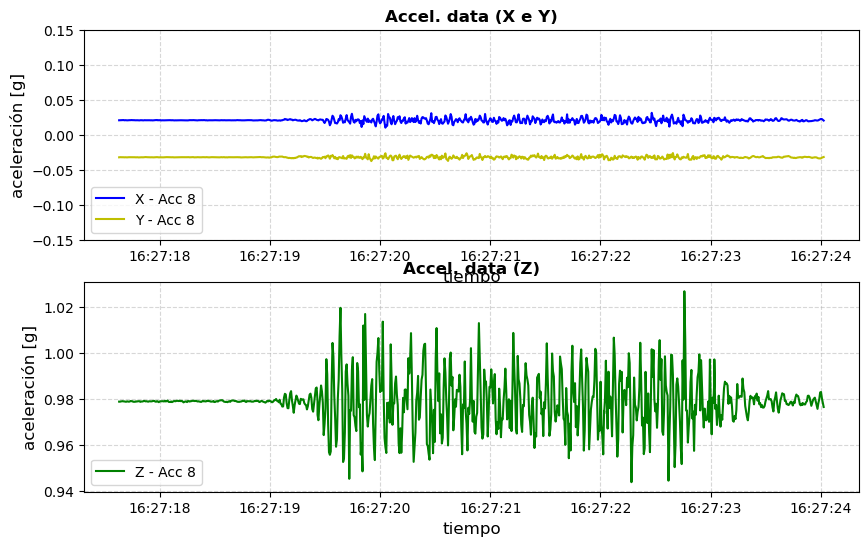

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_071708-20250301_071713.csv


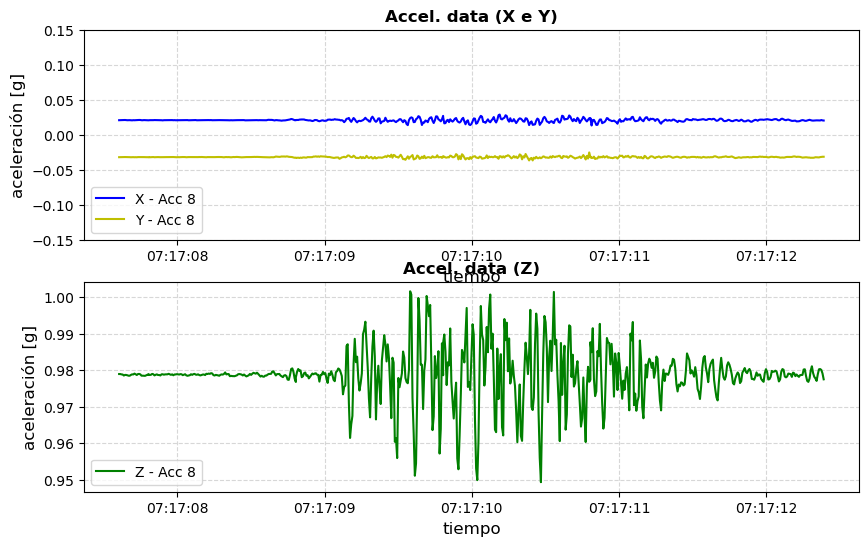

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_083242-20250301_083250.csv


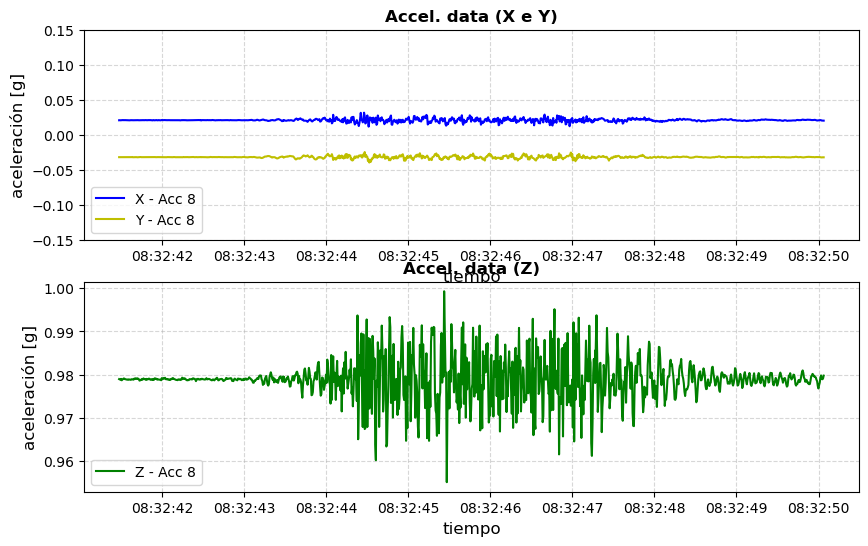

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_200142-20250301_200149.csv


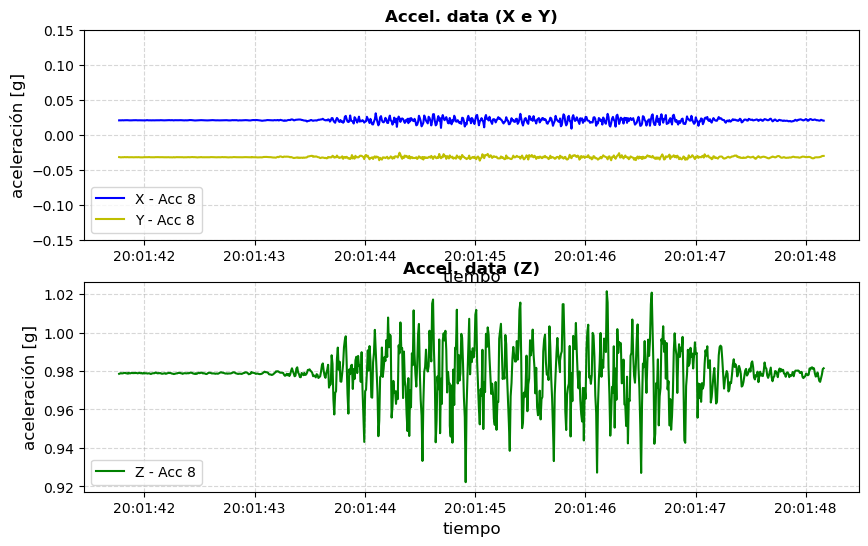

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_144744-20250301_144749.csv


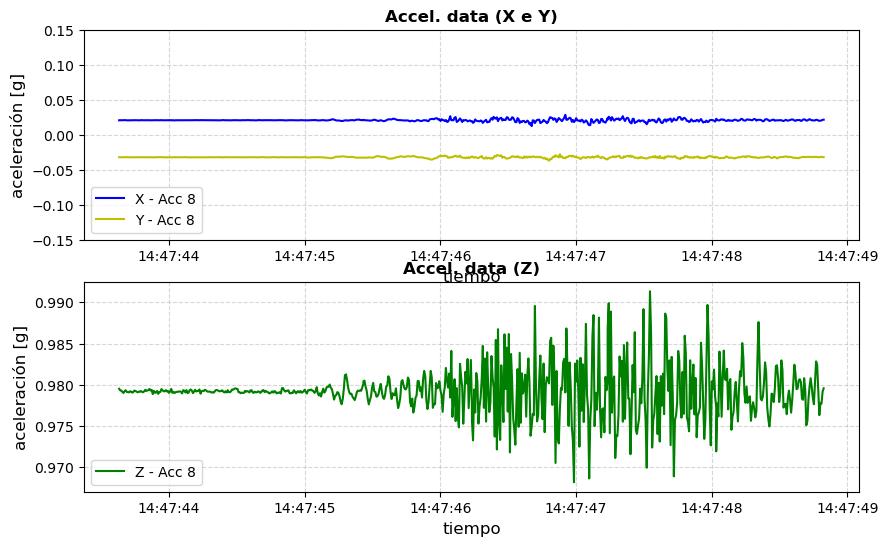

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_124316-20250301_124324.csv


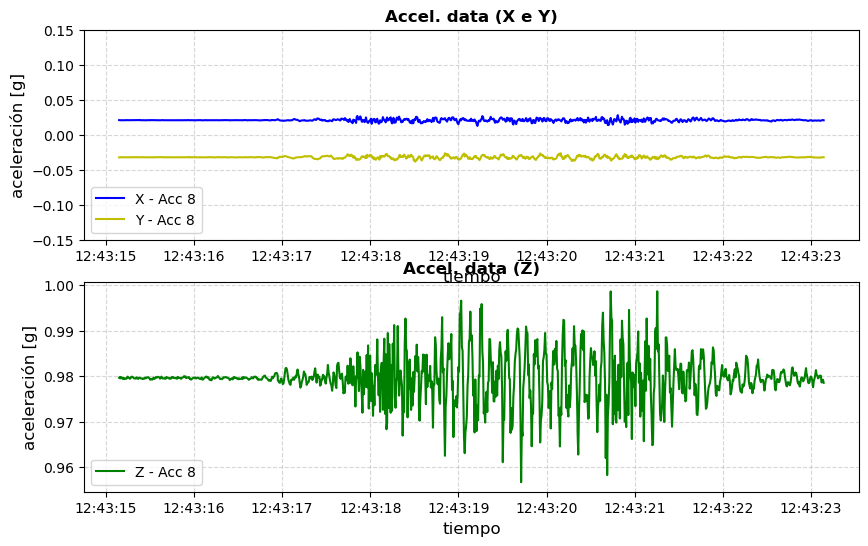

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_124748-20250301_124754.csv


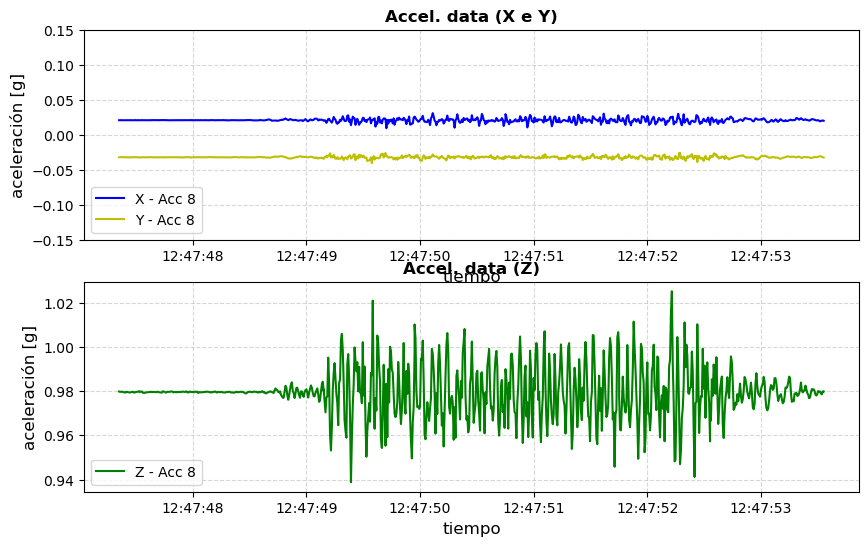

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_095501-20250301_095507.csv


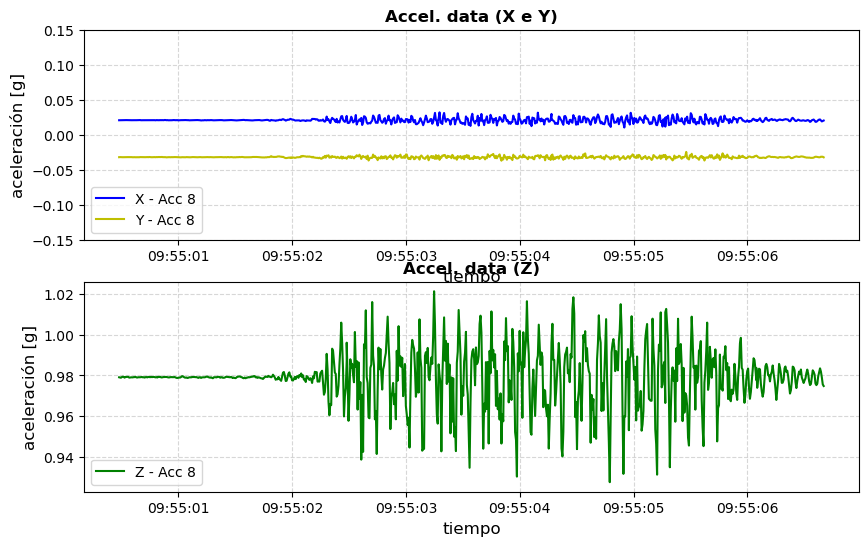

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_205022-20250301_205027.csv
No se encontraron datos para el/los acelerómetro(s) 8 en el archivo Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_205022-20250301_205027.csv
Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_140604-20250301_140611.csv


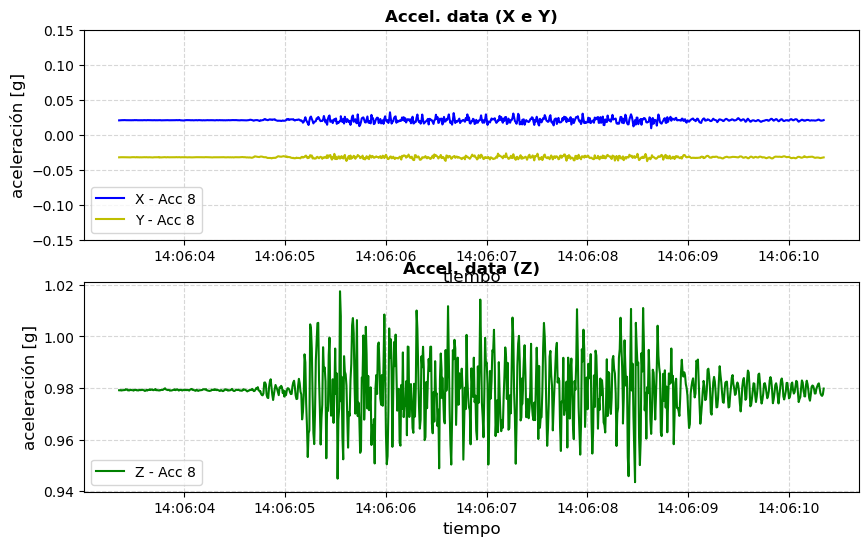

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_135208-20250301_135215.csv


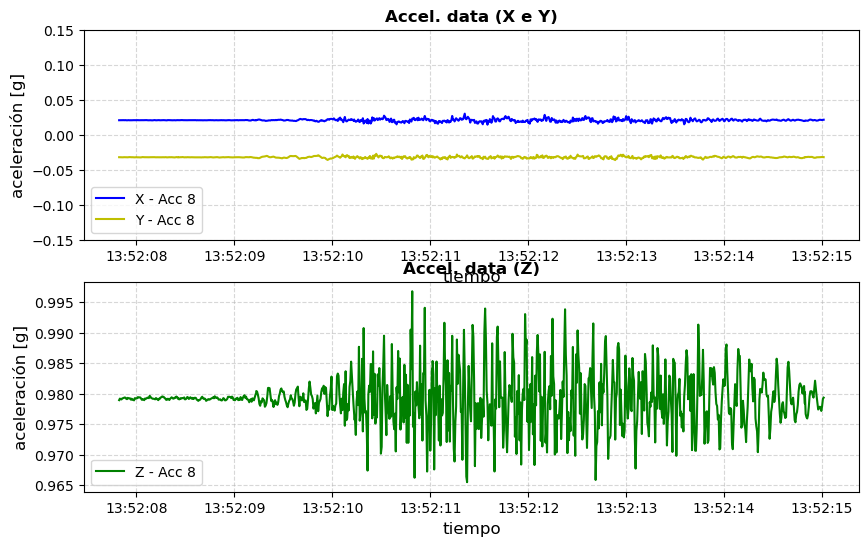

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_151436-20250301_151440.csv


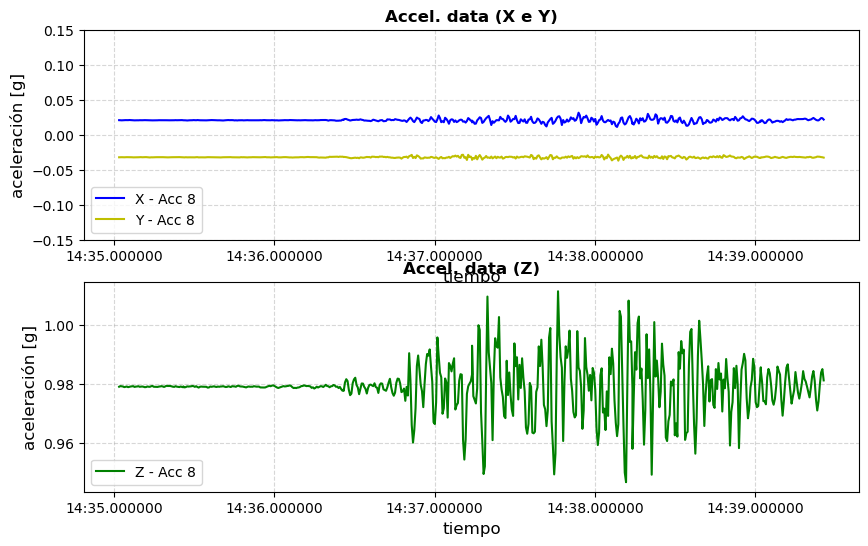

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_145126-20250301_145133.csv


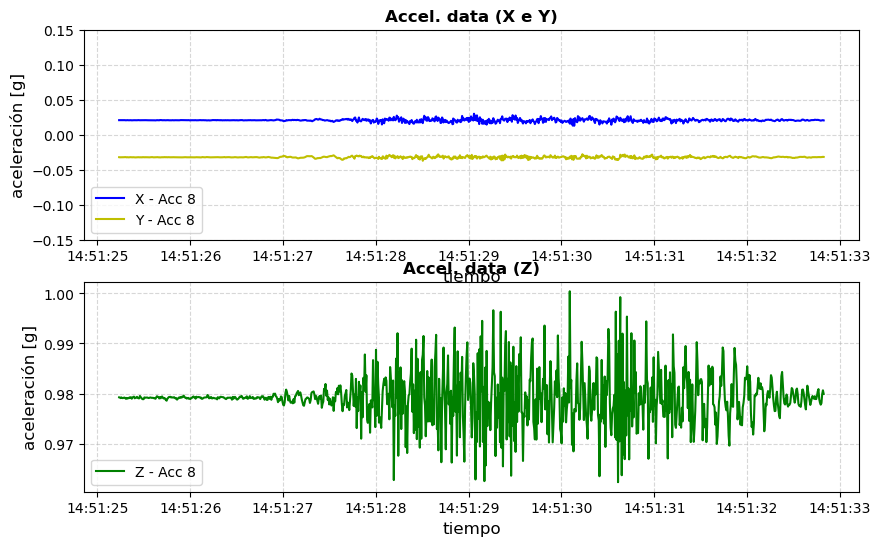

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_053830-20250301_053839.csv


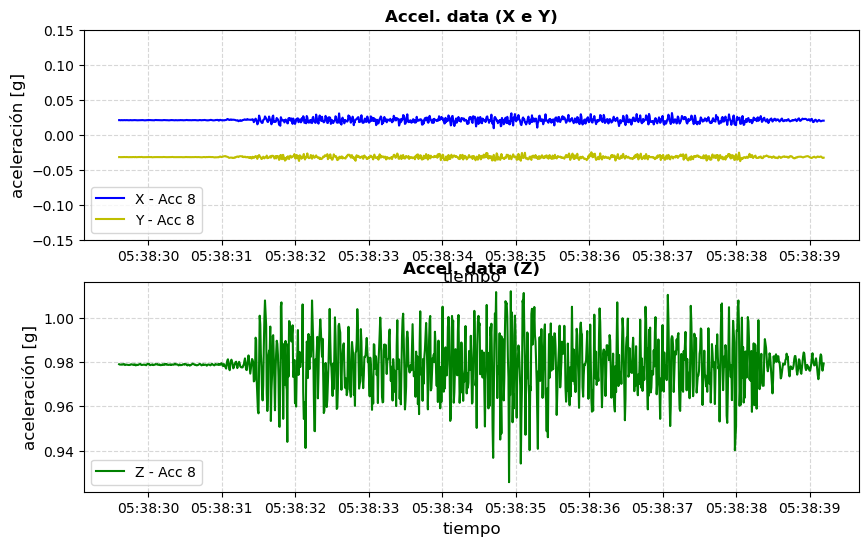

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_174332-20250301_174338.csv


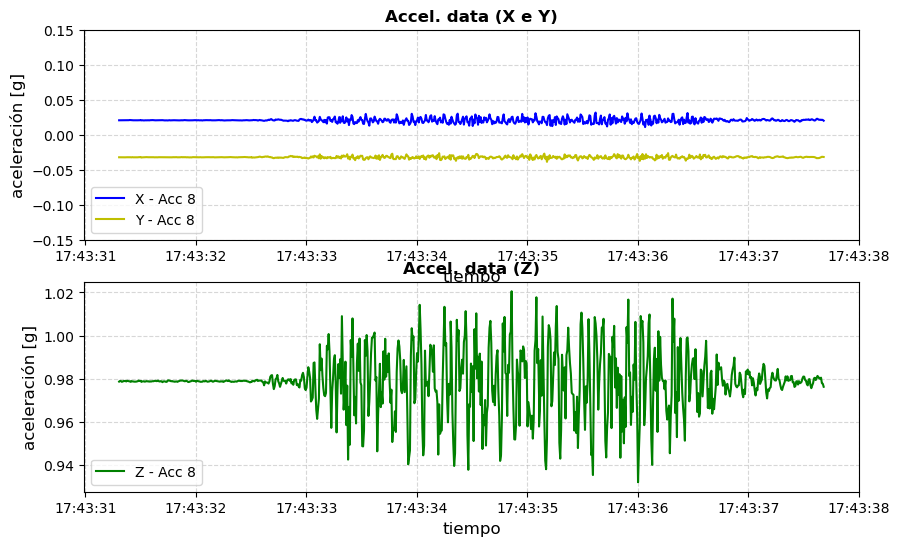

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_120916-20250301_120923.csv


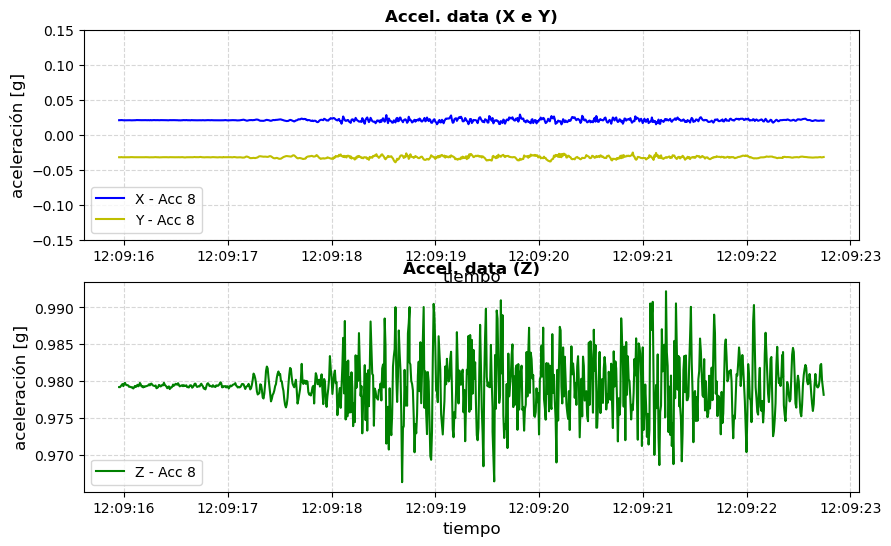

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_090828-20250301_090835.csv


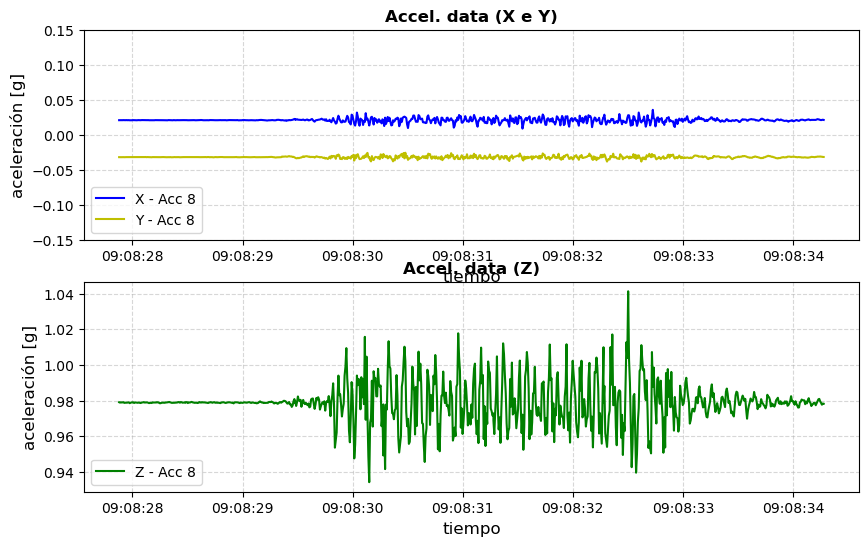

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_110209-20250301_110216.csv


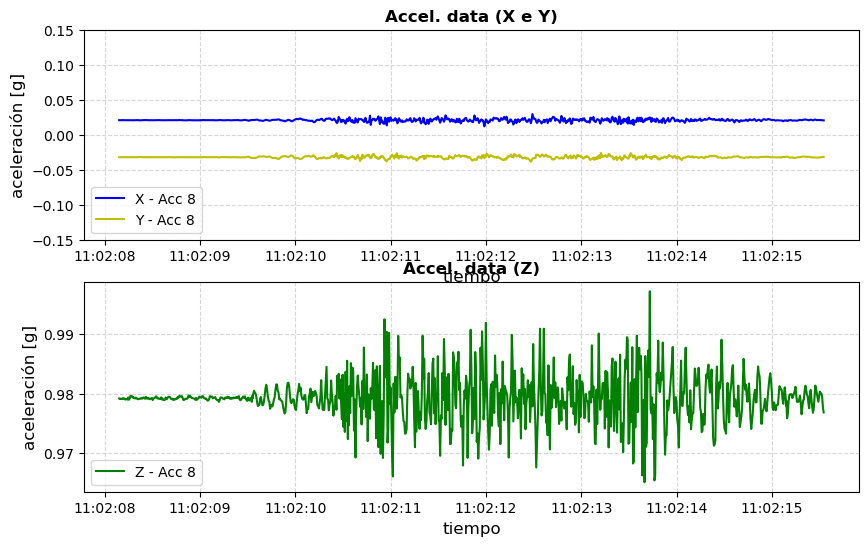

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_095115-20250301_095124.csv


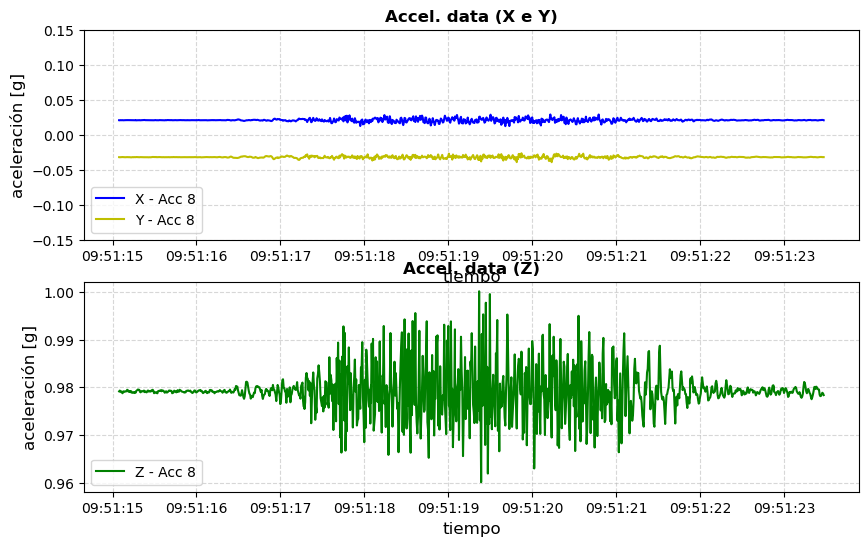

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_070205-20250301_070211.csv


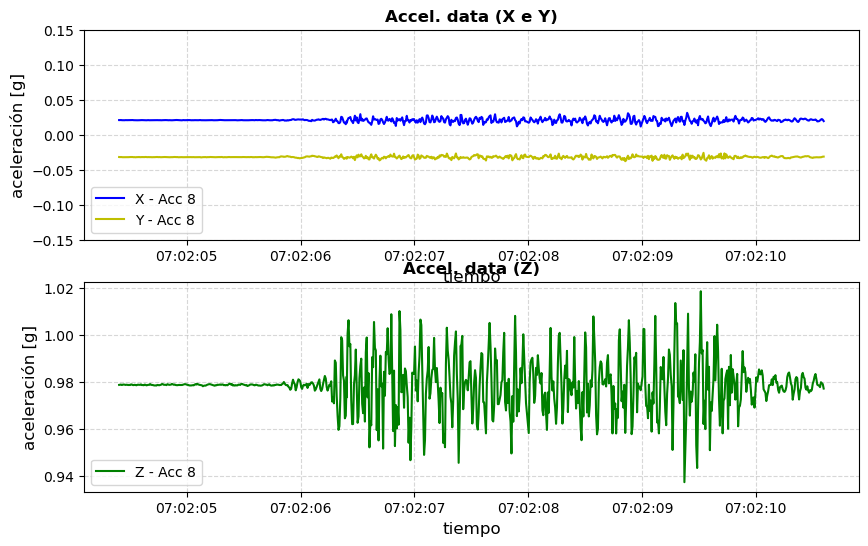

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_071133-20250301_071139.csv


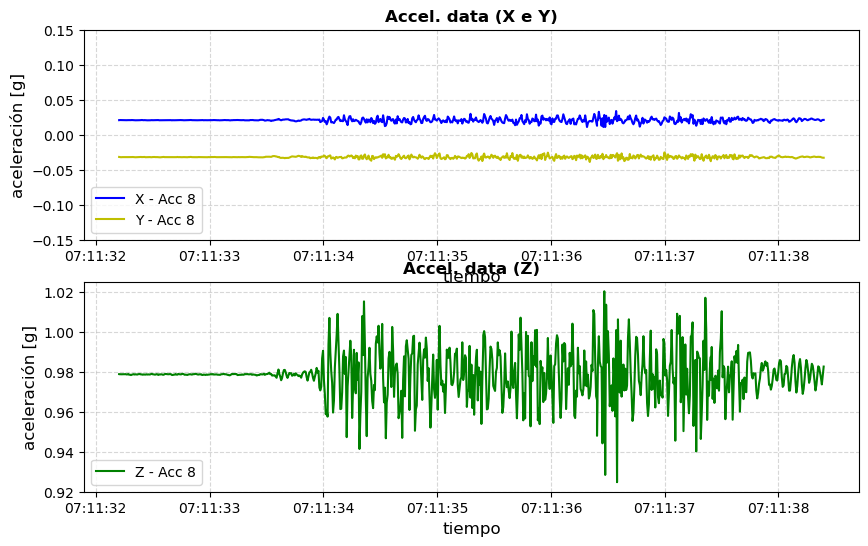

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_161940-20250301_161947.csv


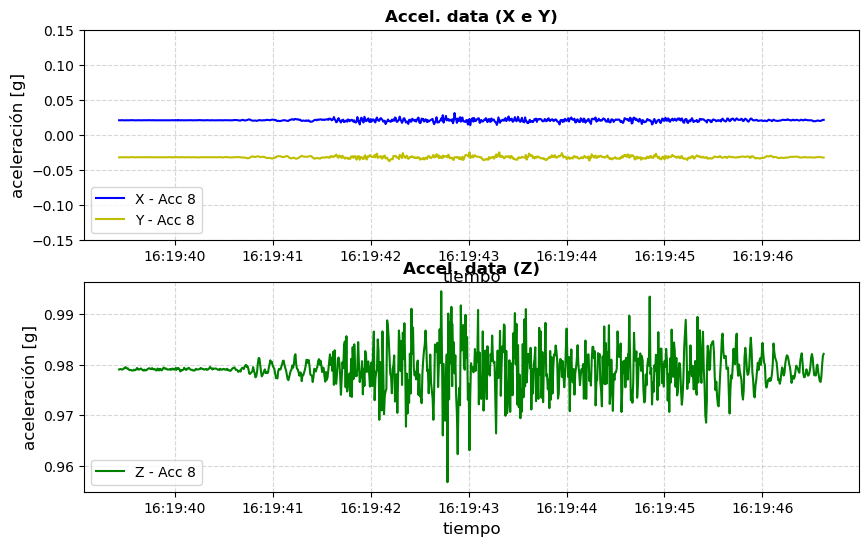

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_073507-20250301_073512.csv


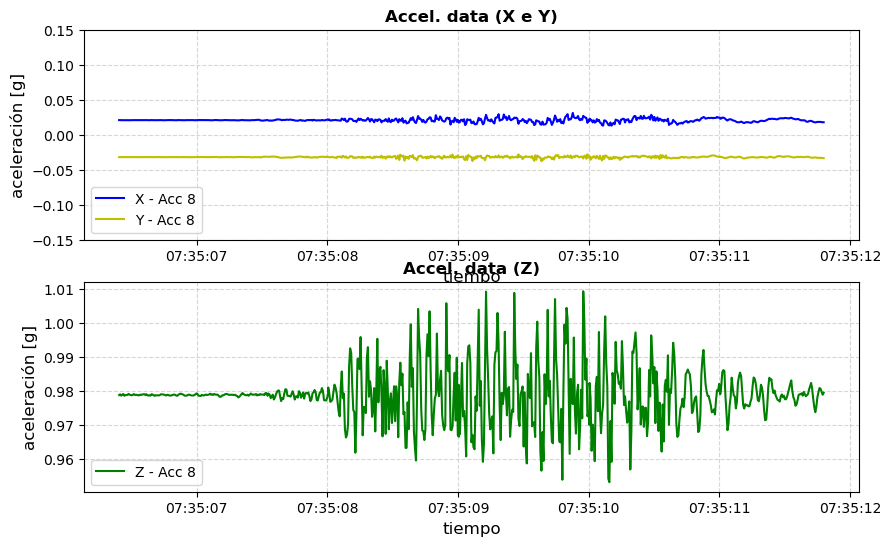

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_150713-20250301_150719.csv


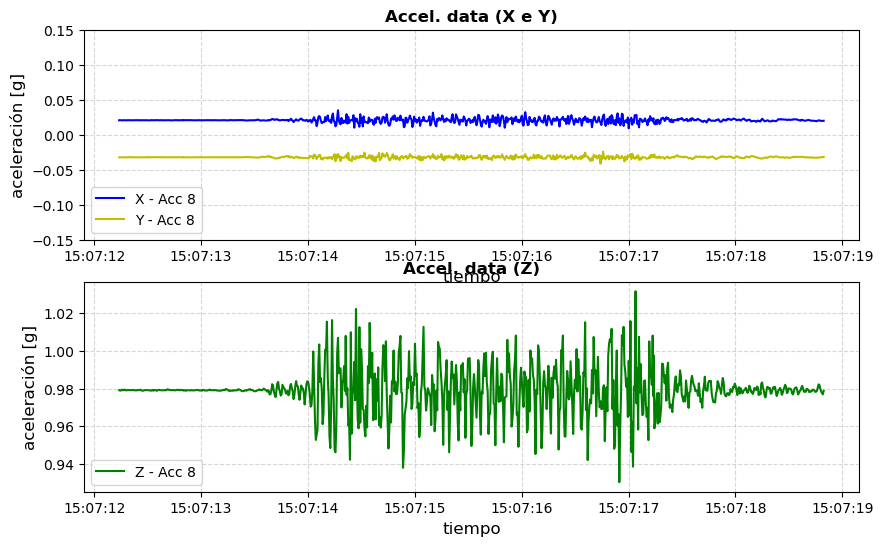

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_093809-20250301_093814.csv


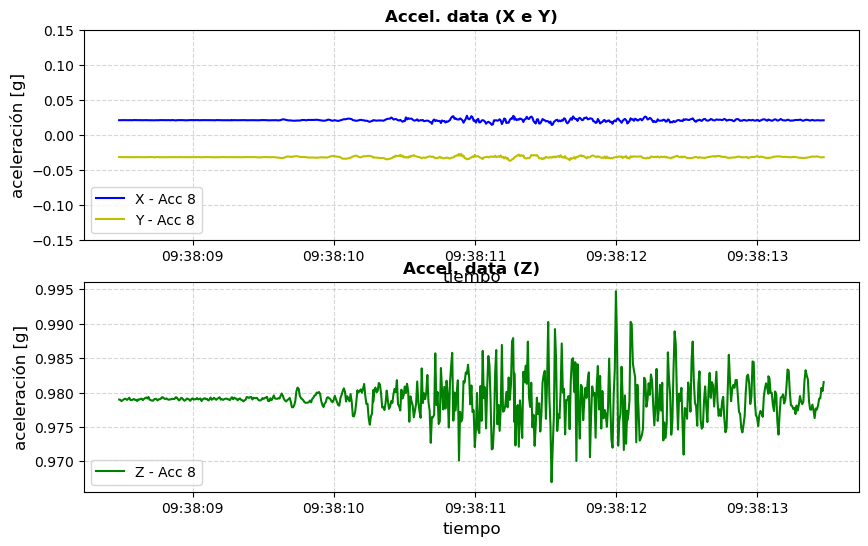

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_192440-20250301_192446.csv


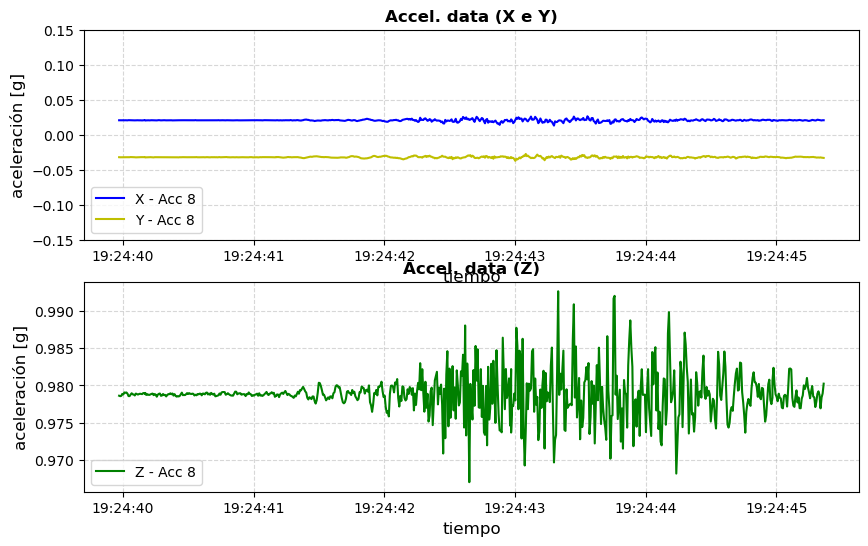

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_223825-20250301_223832.csv
No se encontraron datos para el/los acelerómetro(s) 8 en el archivo Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_223825-20250301_223832.csv
Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_182713-20250301_182719.csv


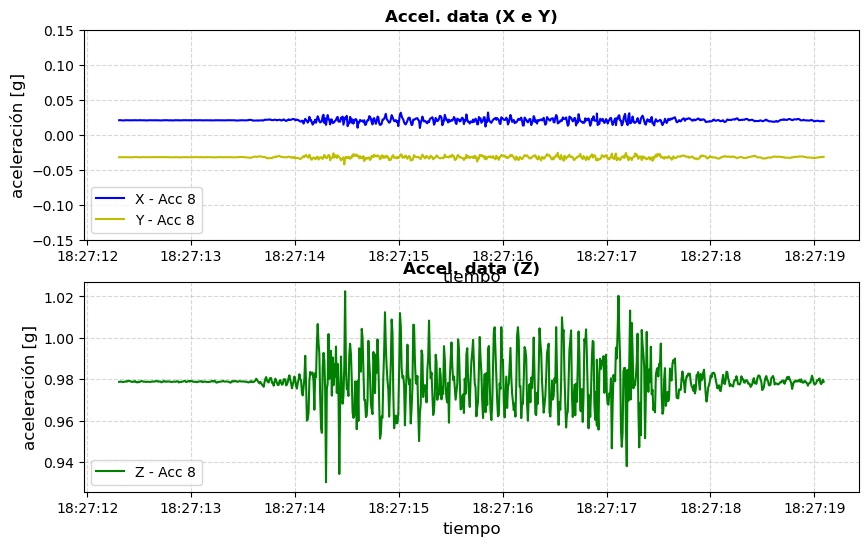

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_161259-20250301_161307.csv


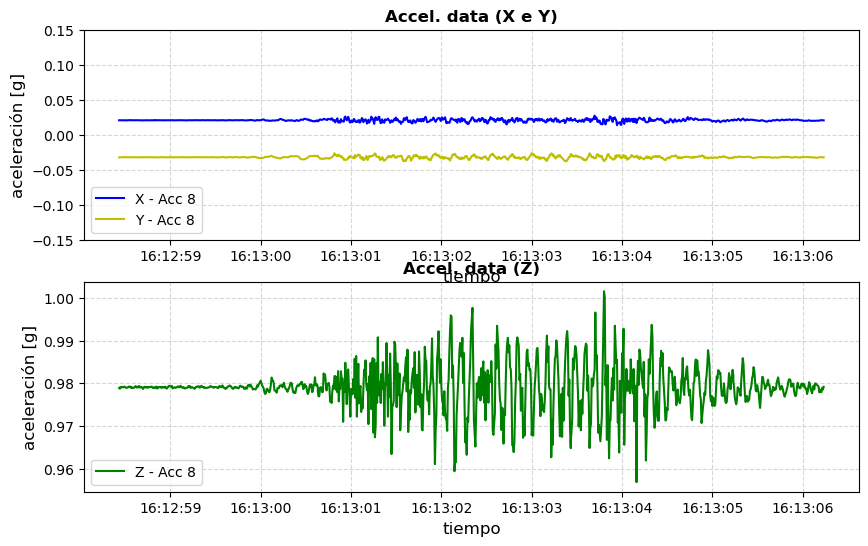

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_115939-20250301_115946.csv


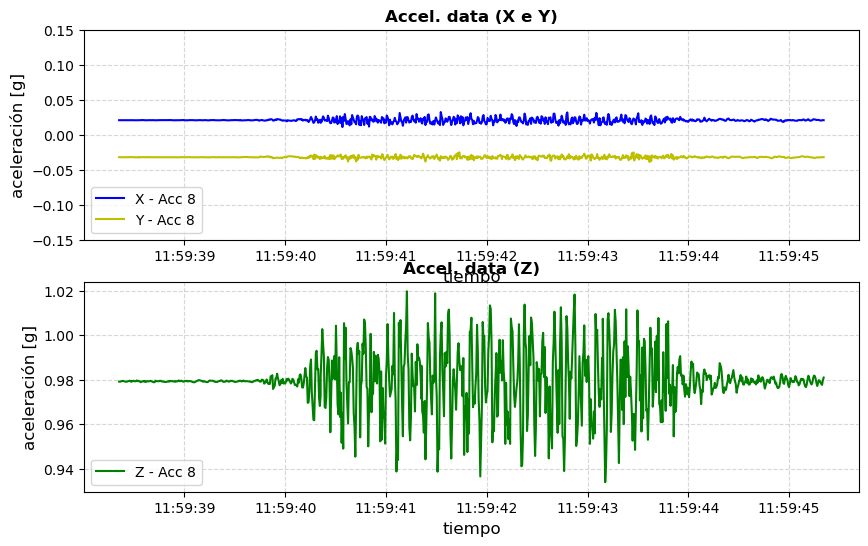

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_155308-20250301_155315.csv


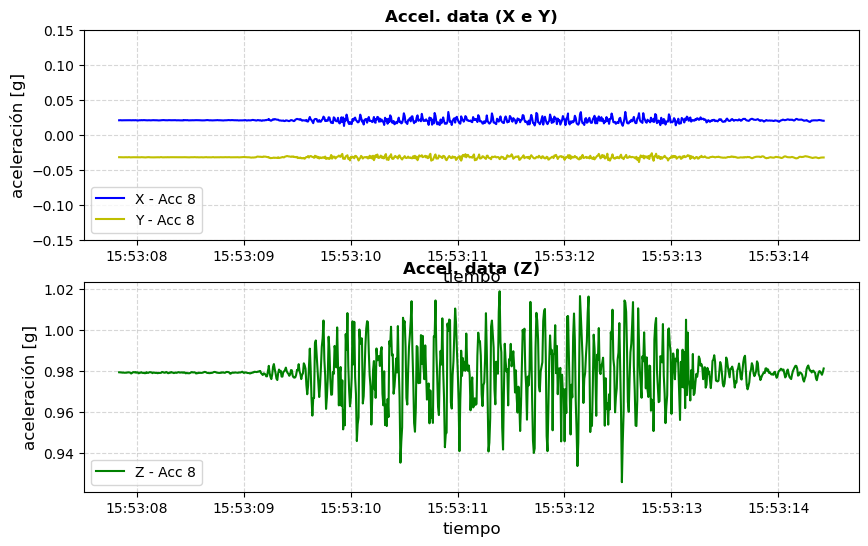

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_074835-20250301_074842.csv


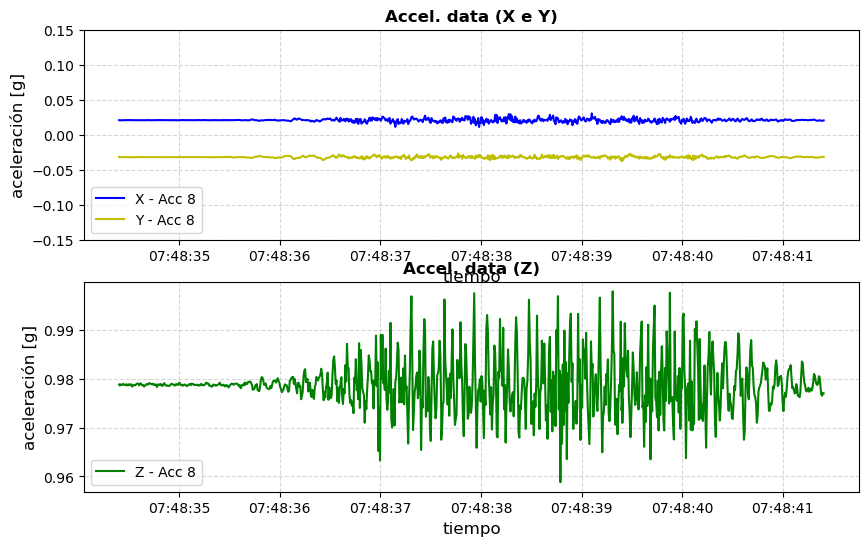

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_135521-20250301_135528.csv


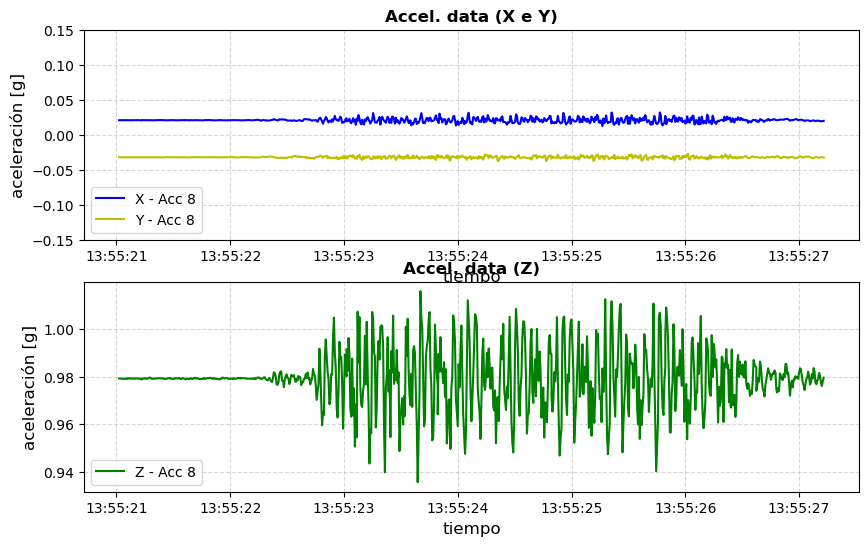

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_184146-20250301_184153.csv


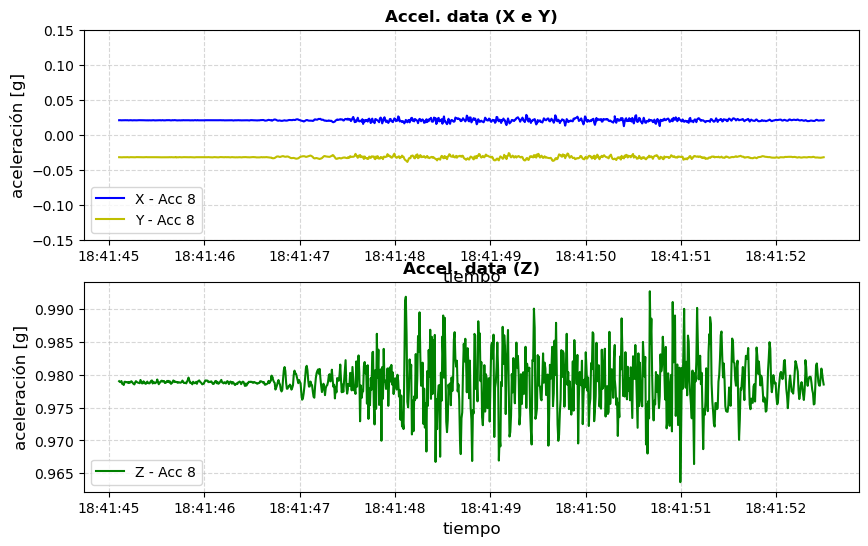

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_073100-20250301_073105.csv


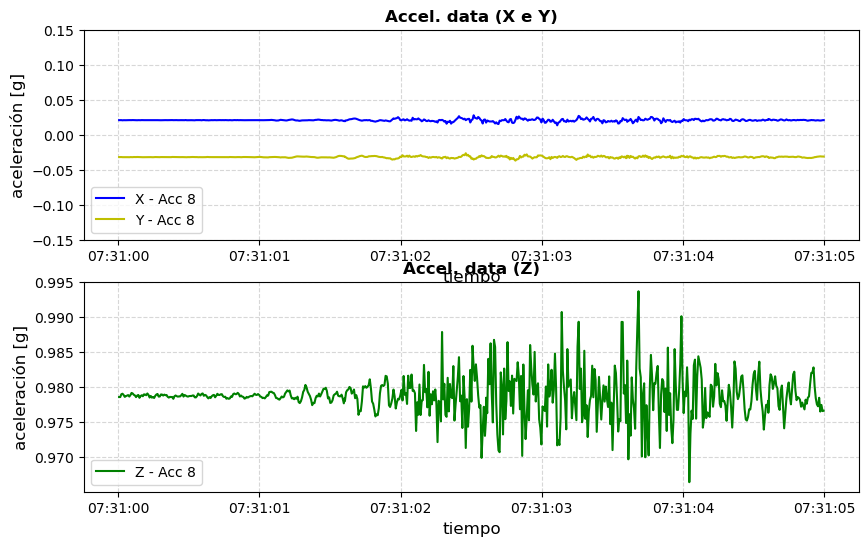

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_161031-20250301_161037.csv


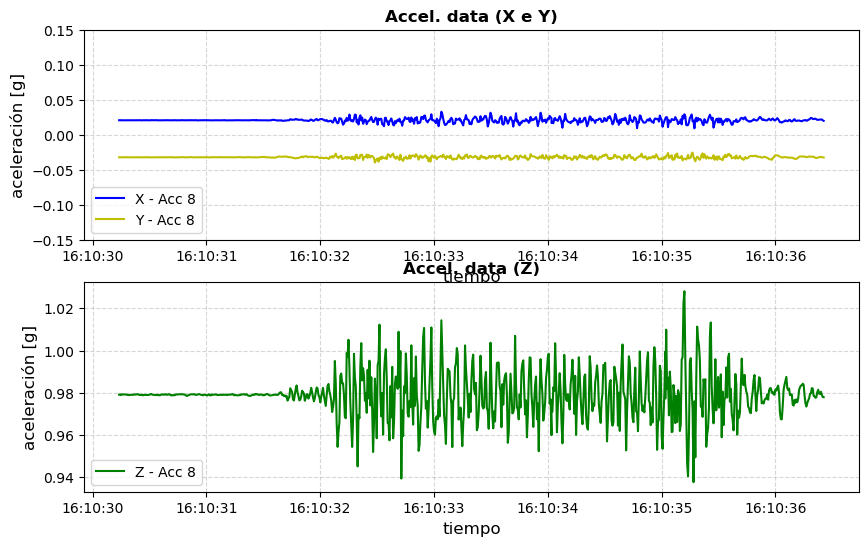

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_165937-20250301_165945.csv


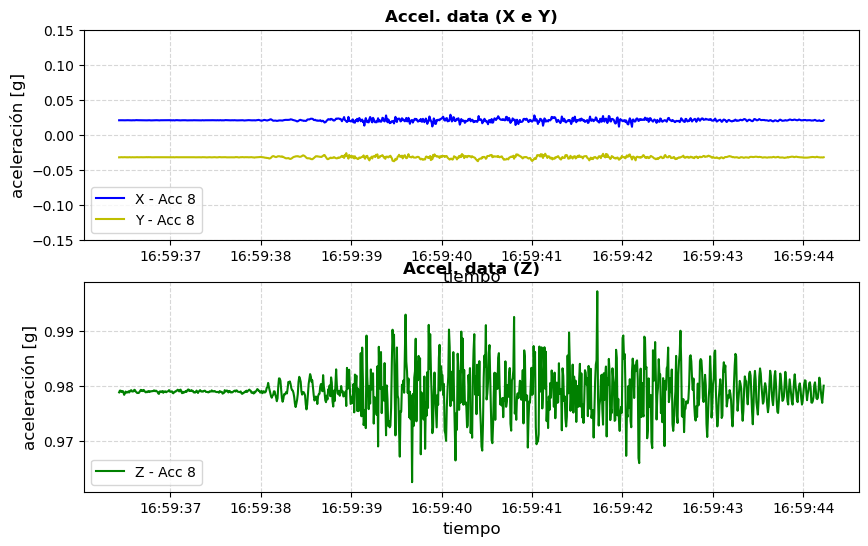

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_203324-20250301_203331.csv
No se encontraron datos para el/los acelerómetro(s) 8 en el archivo Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_203324-20250301_203331.csv
Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_124134-20250301_124139.csv


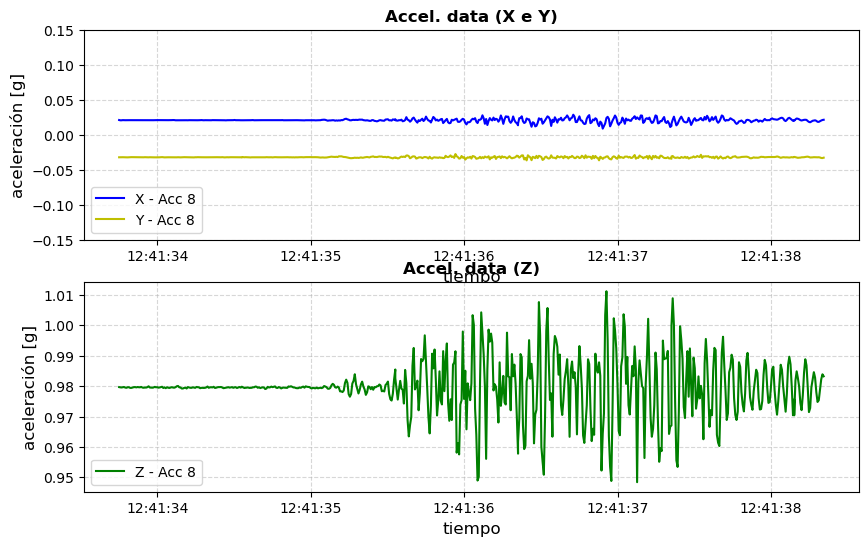

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_153302-20250301_153308.csv


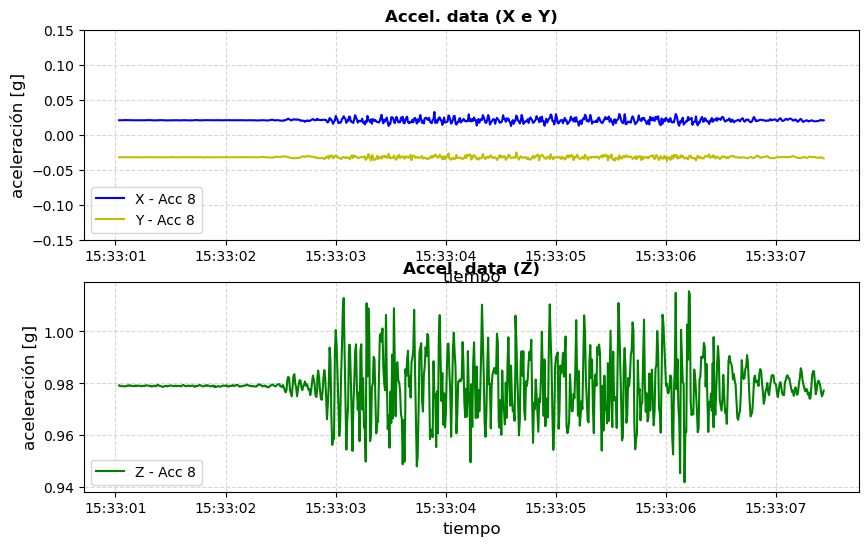

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_090029-20250301_090034.csv


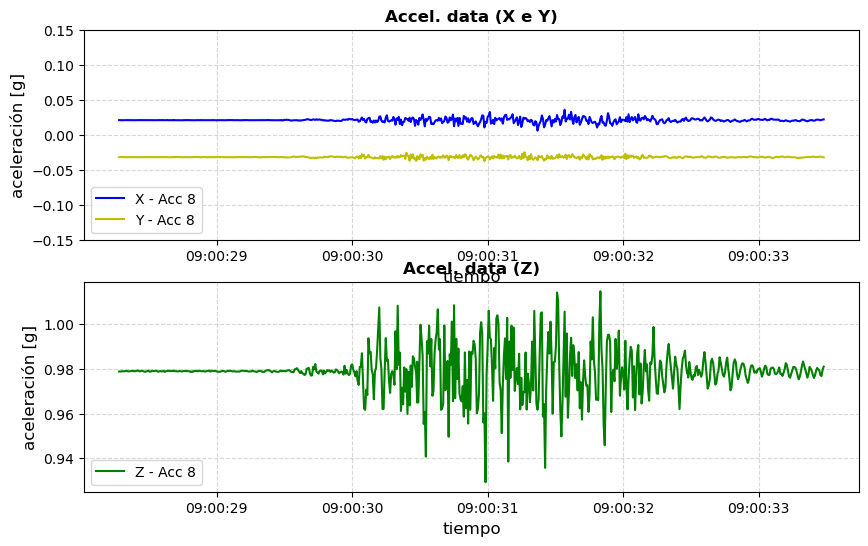

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_130233-20250301_130241.csv


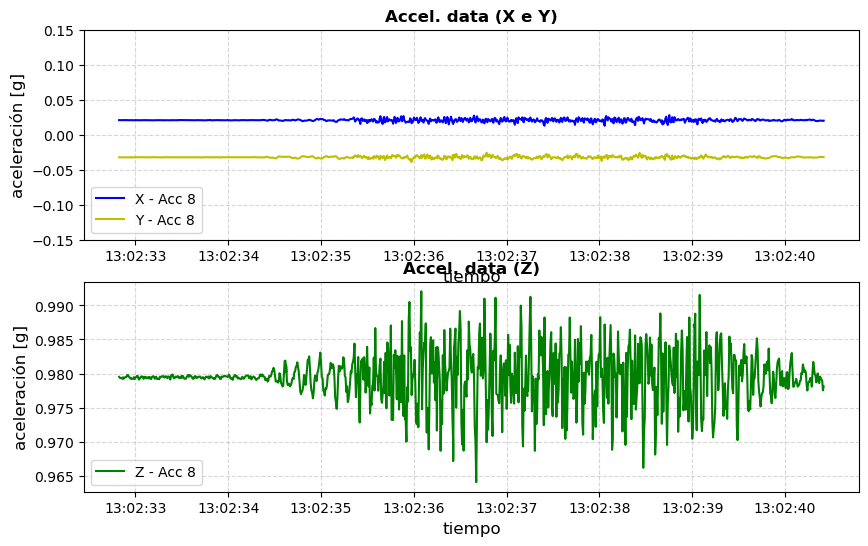

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_193331-20250301_193337.csv


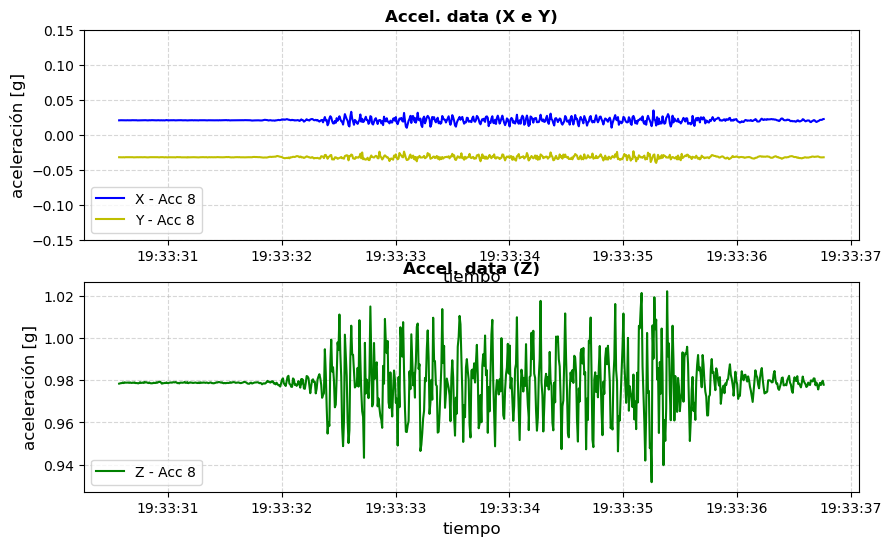

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_080455-20250301_080501.csv


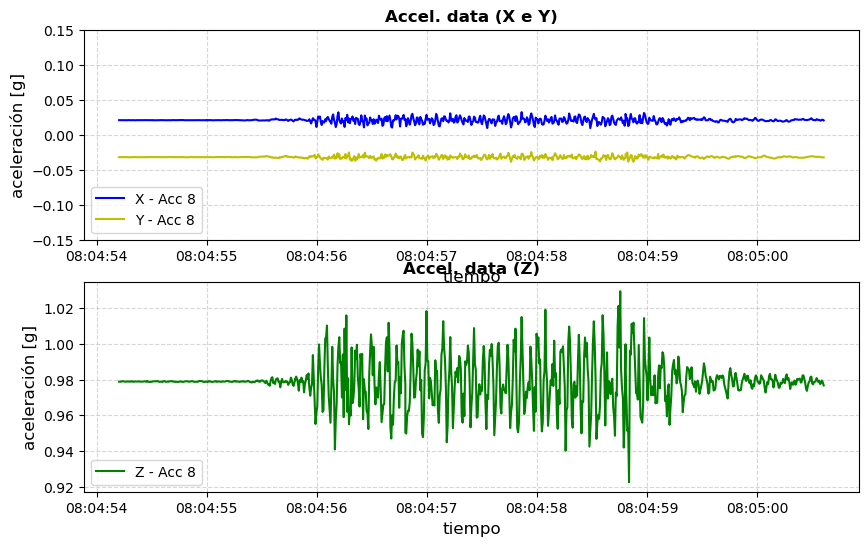

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_103053-20250301_103059.csv


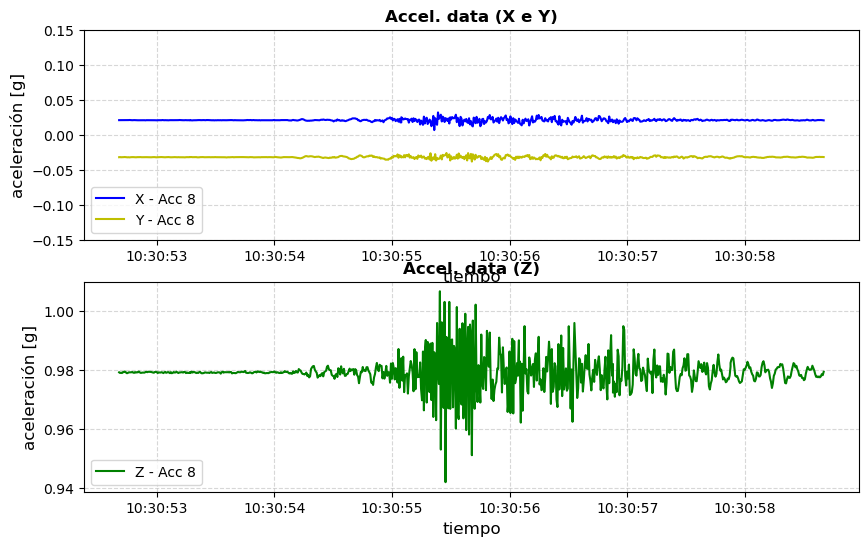

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_101342-20250301_101350.csv


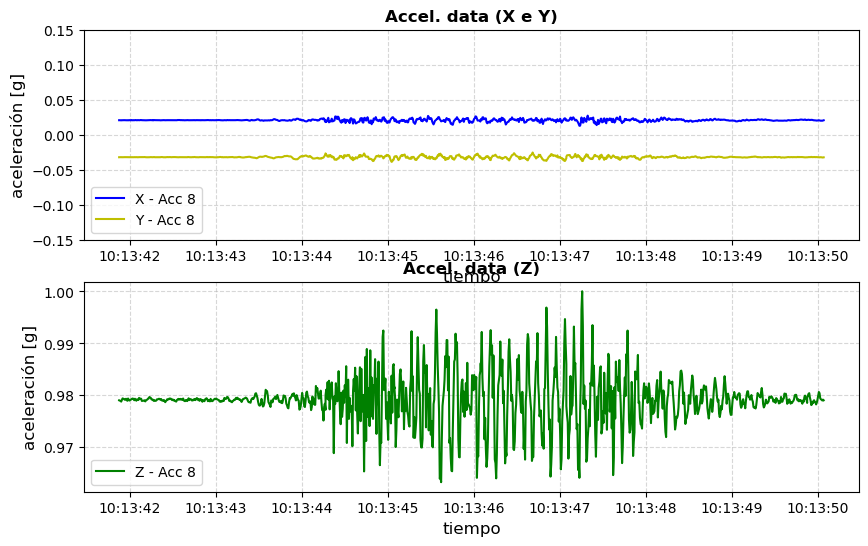

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_081256-20250301_081302.csv


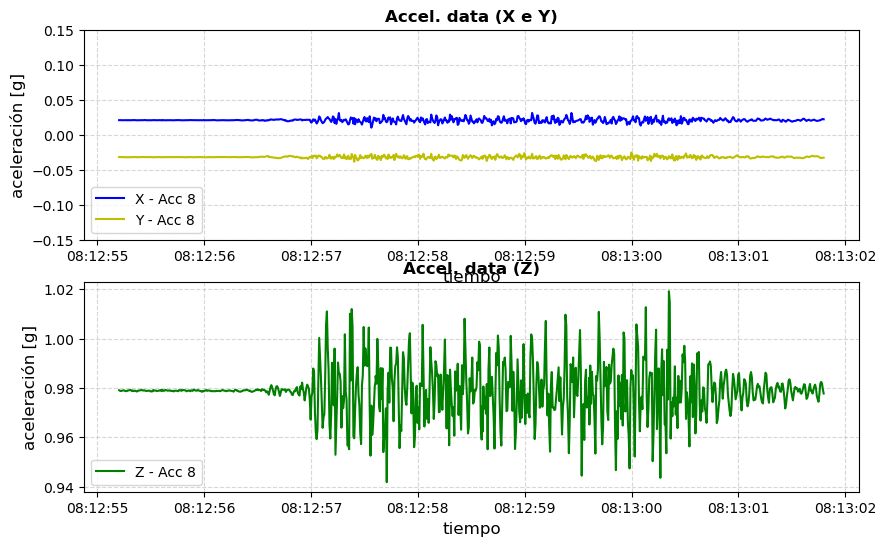

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_191622-20250301_191628.csv


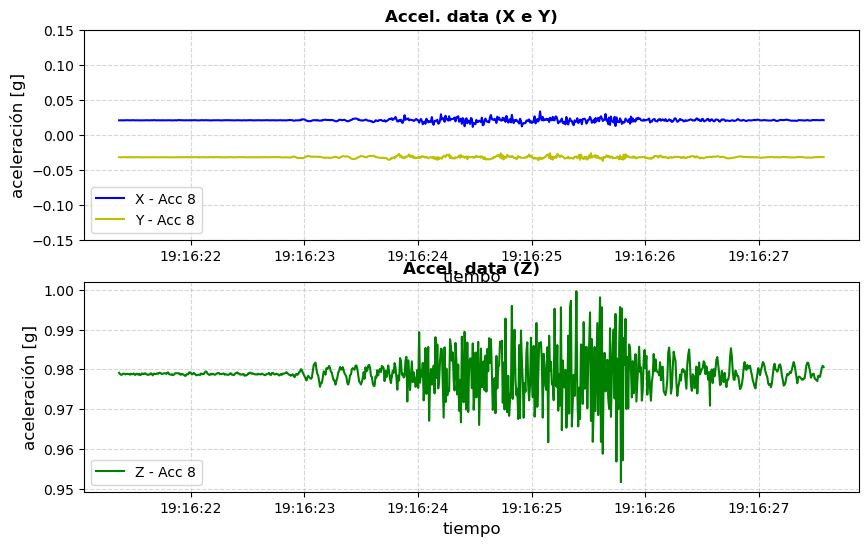

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_110756-20250301_110803.csv


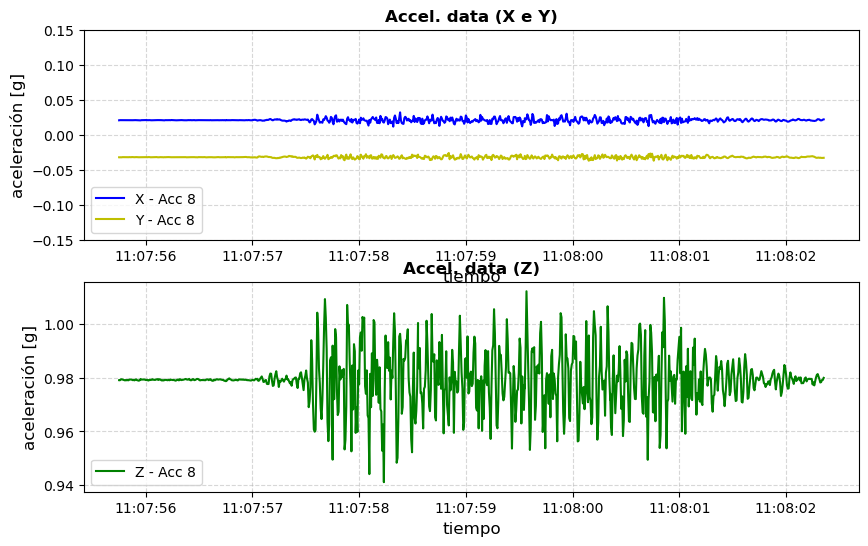

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_091426-20250301_091433.csv


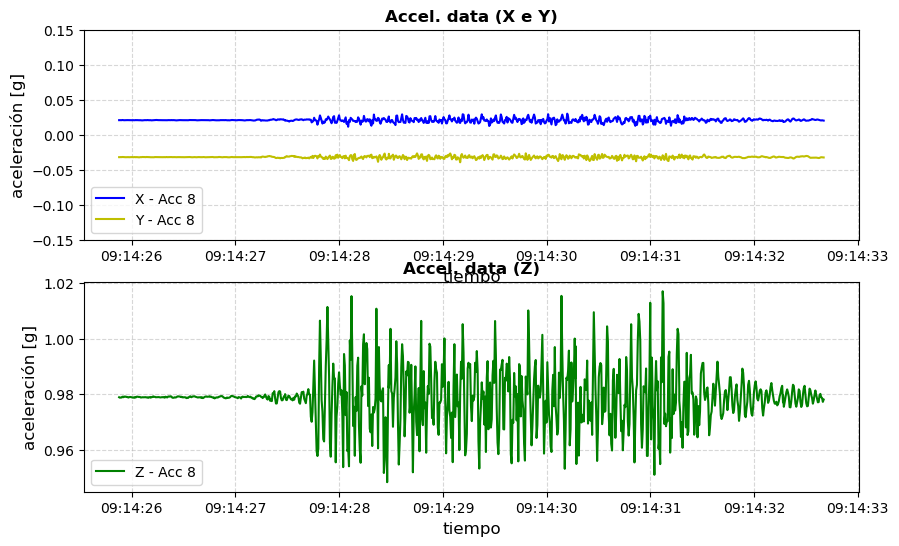

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_183814-20250301_183819.csv


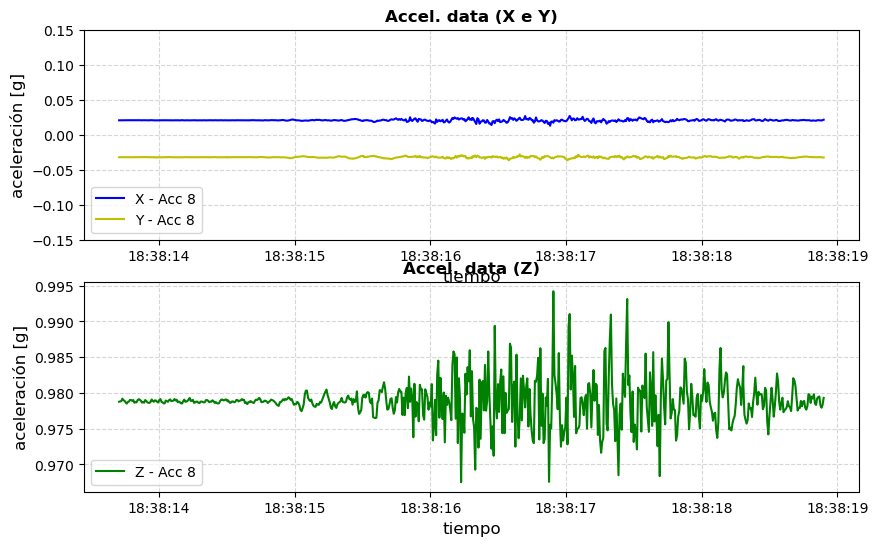

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_120316-20250301_120323.csv


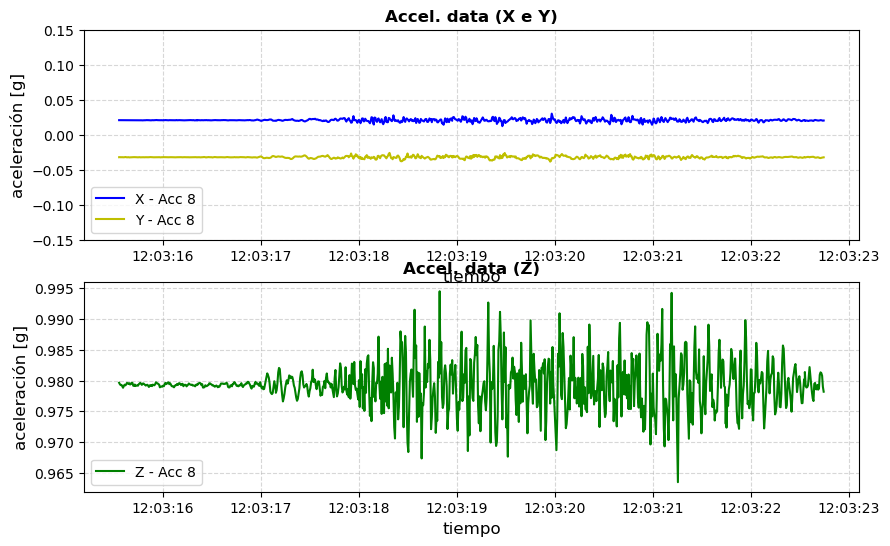

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_175231-20250301_175238.csv


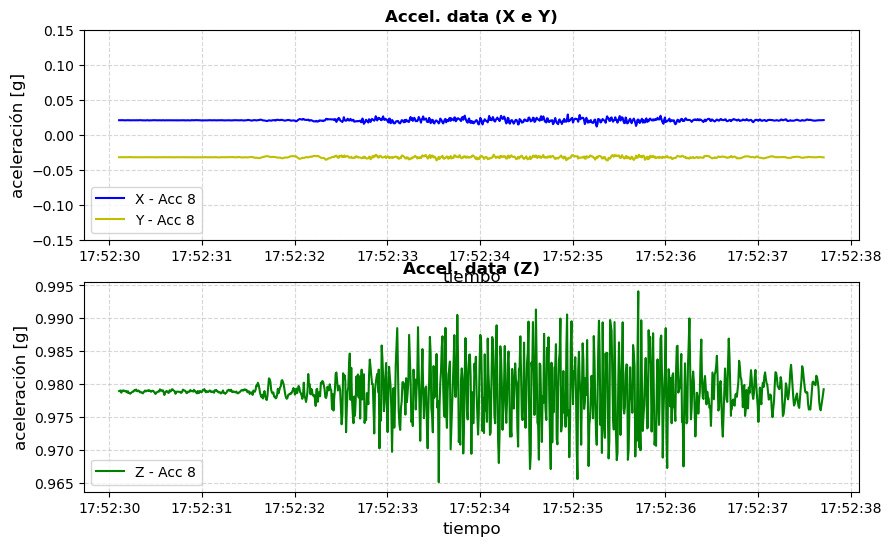

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_063128-20250301_063135.csv


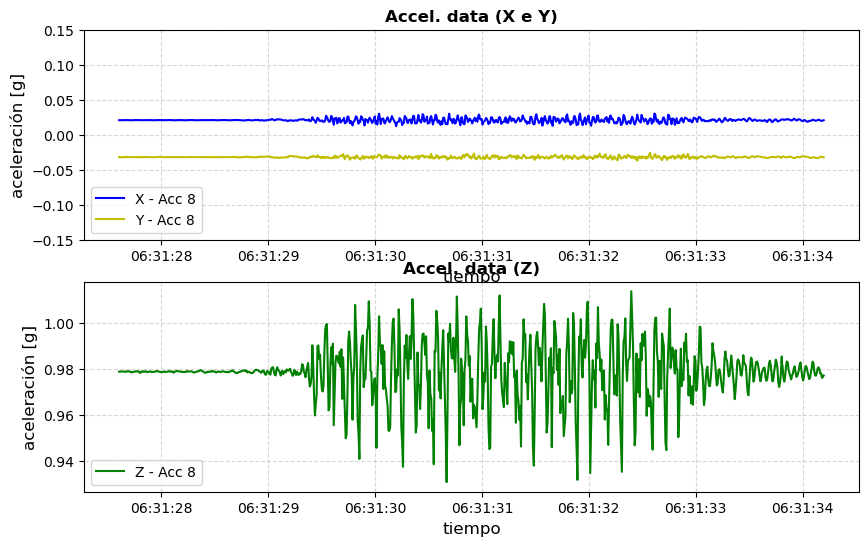

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_170545-20250301_170554.csv


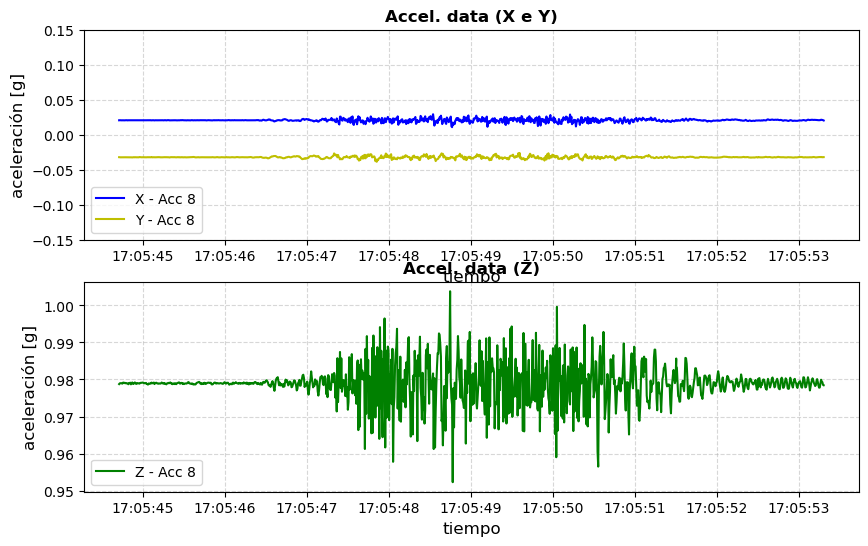

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_140057-20250301_140105.csv


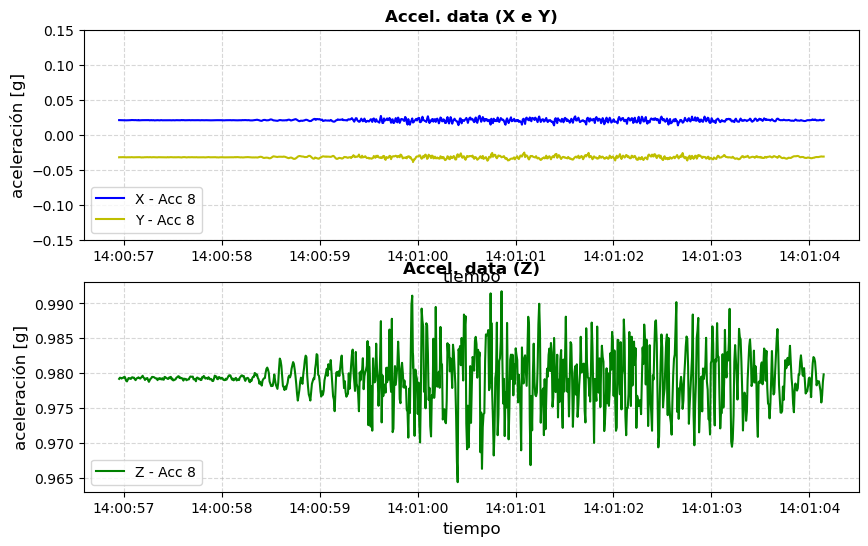

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_191858-20250301_191905.csv


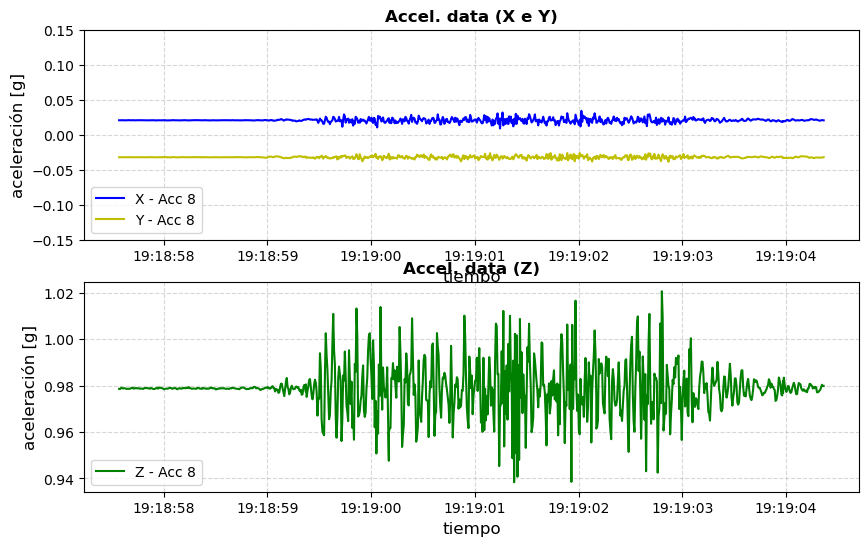

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_195125-20250301_195130.csv


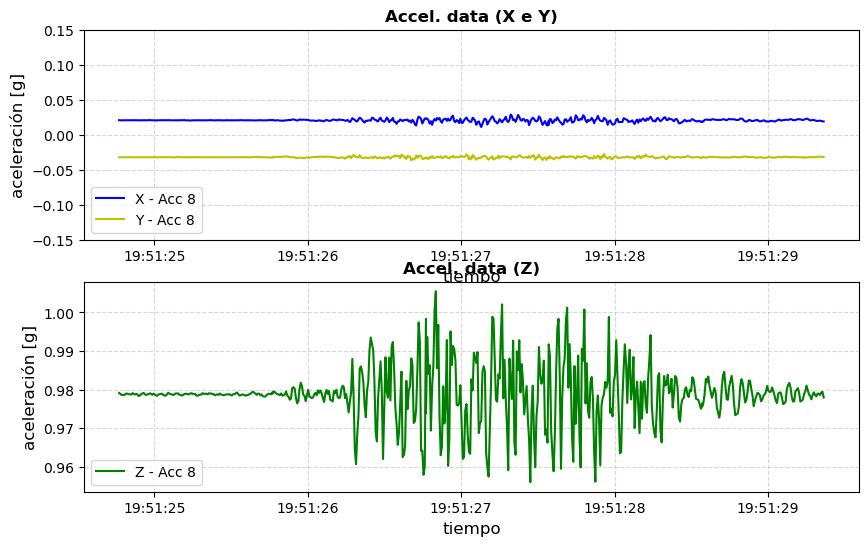

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_082038-20250301_082045.csv


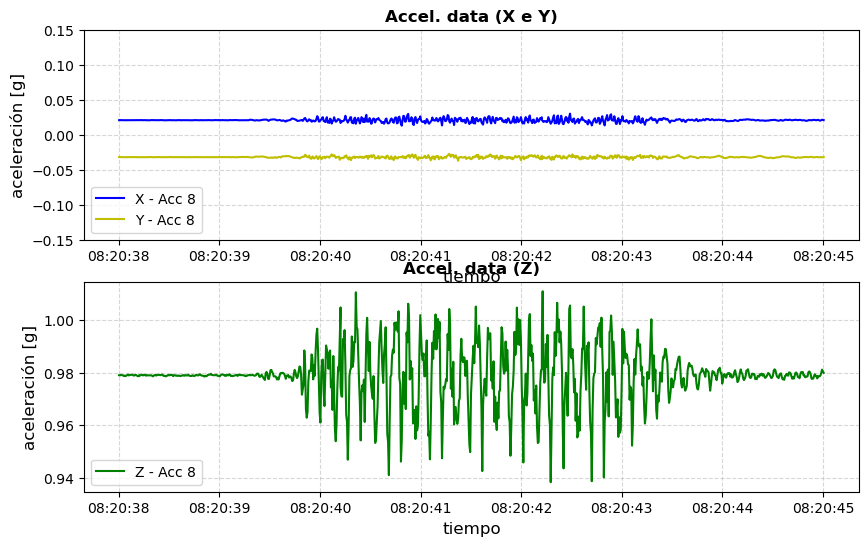

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_181053-20250301_181101.csv


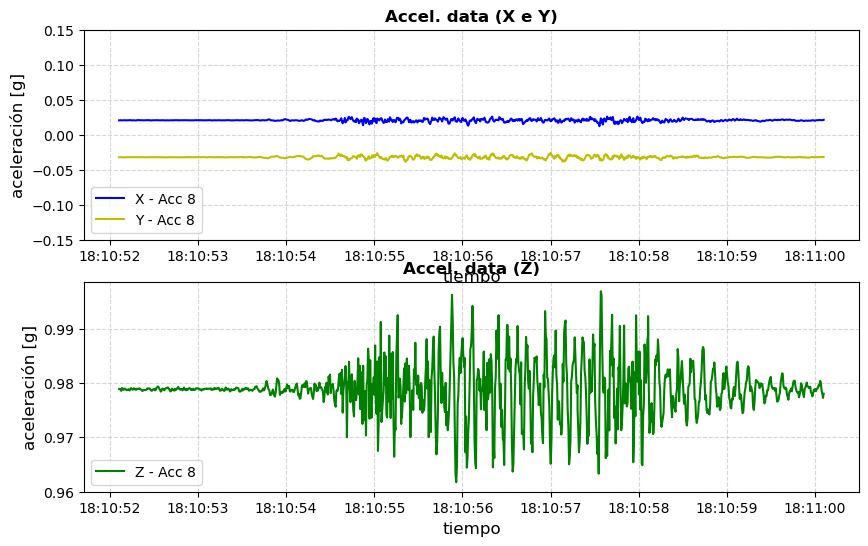

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_132210-20250301_132218.csv


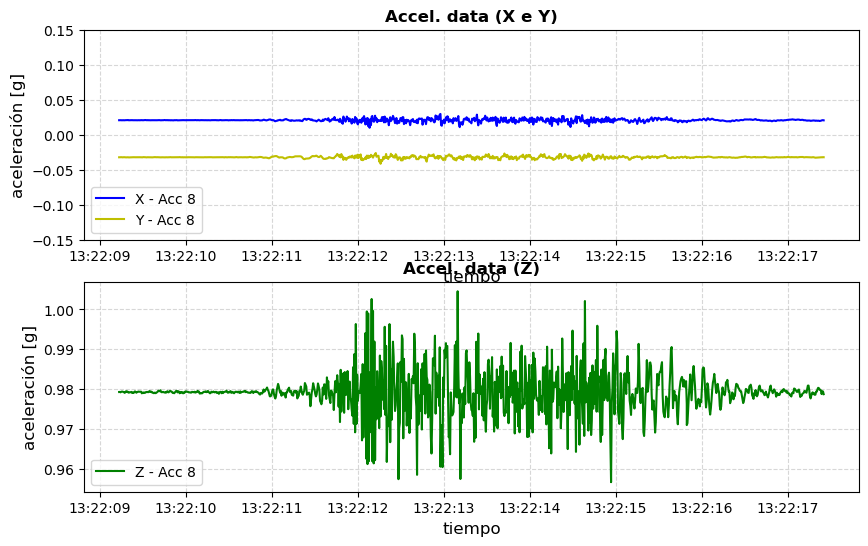

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_132926-20250301_132931.csv


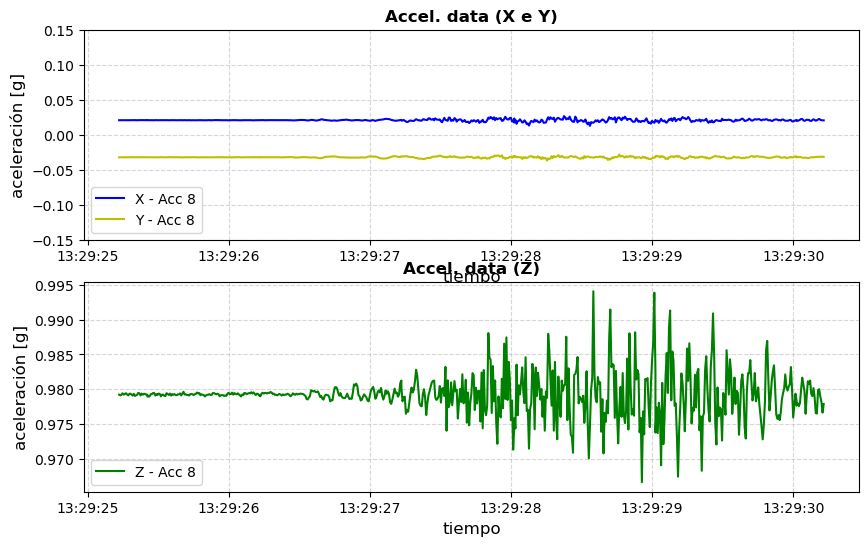

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_172417-20250301_172424.csv


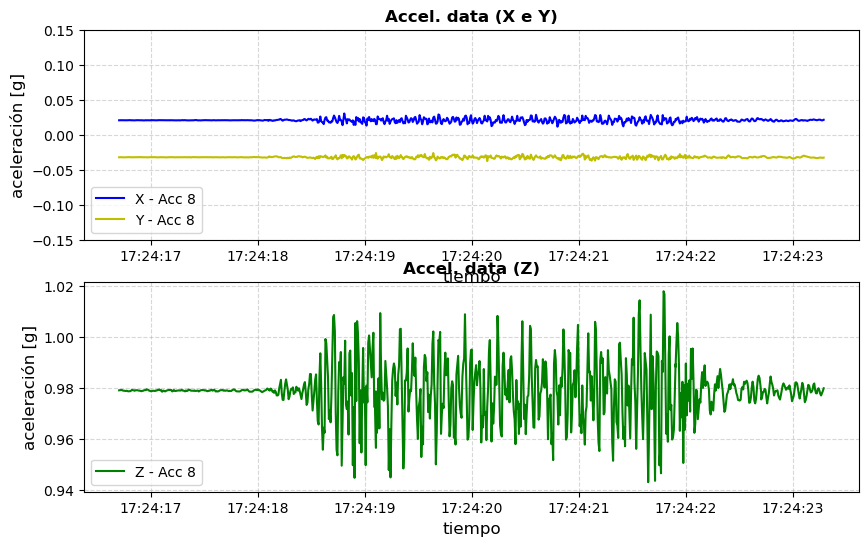

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_090700-20250301_090708.csv


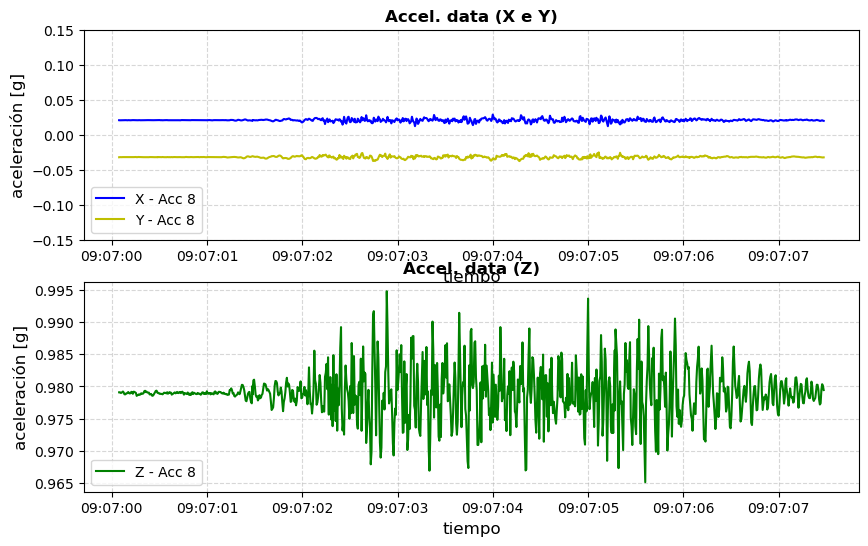

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_071858-20250301_071903.csv


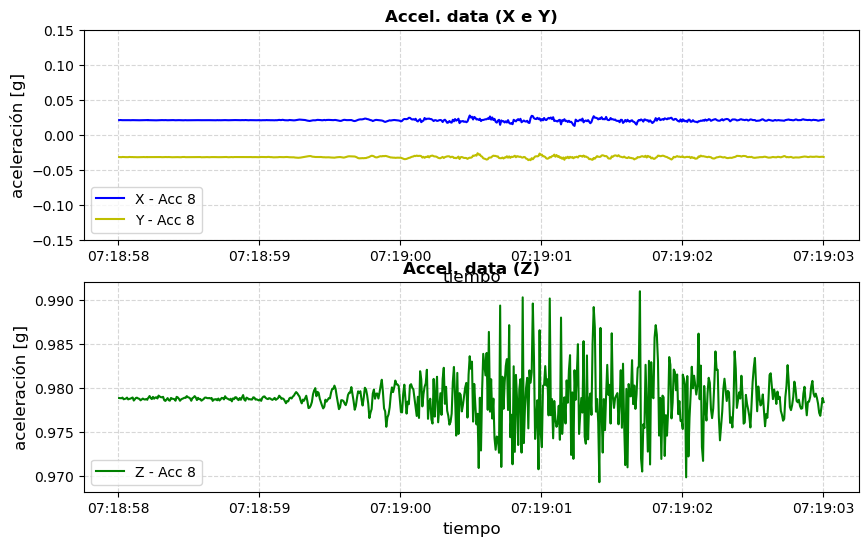

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_193248-20250301_193256.csv


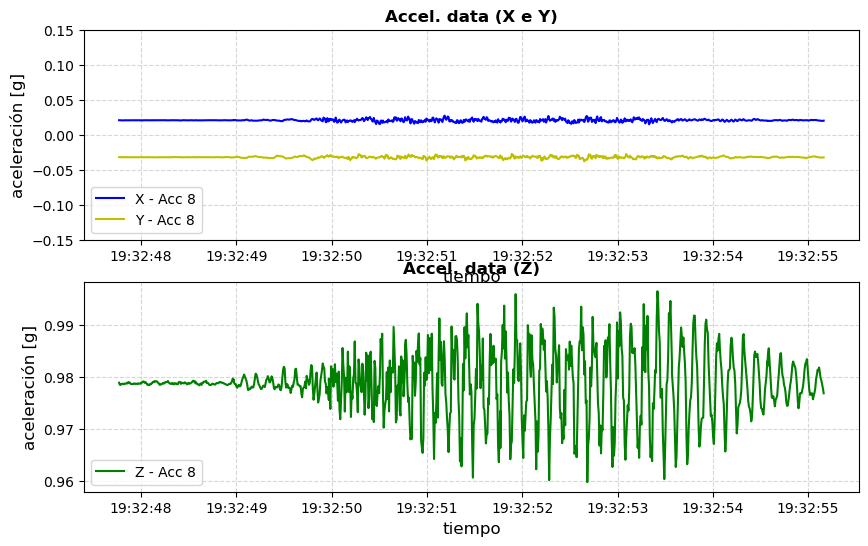

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_200353-20250301_200400.csv


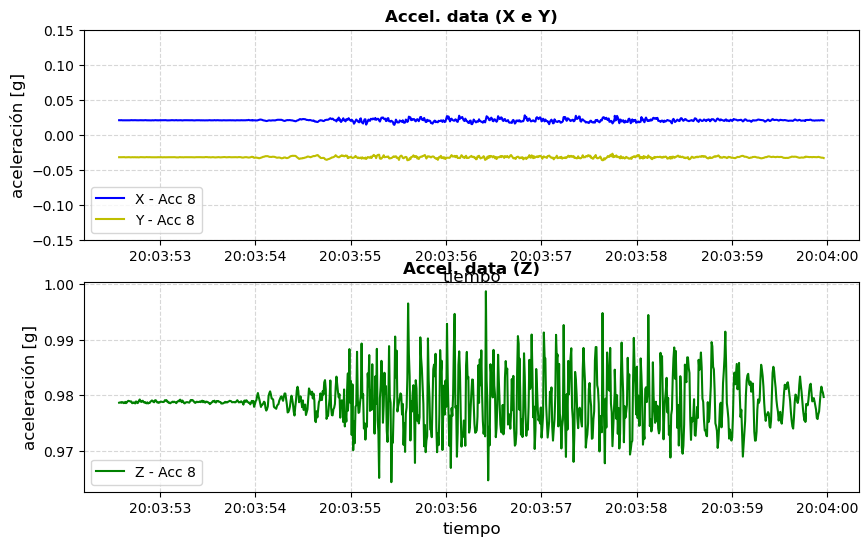

Procesando archivo: Escritorio/SMART-BRIDGES/Guadiato/Guadiato-20250301_191311-20250301_191316.csv


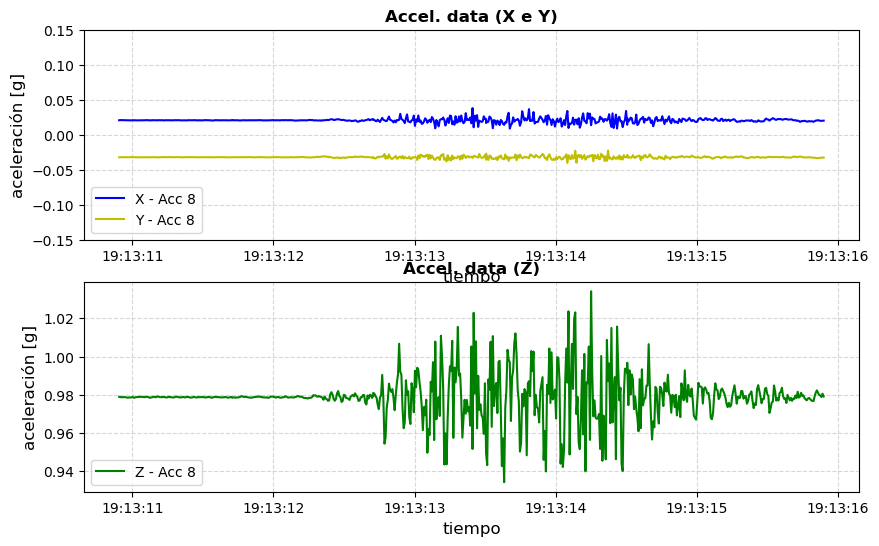

In [32]:
plot_train('Escritorio/SMART-BRIDGES/Guadiato/', accelerometers=8)